In [1]:
# Importing the class from the file

from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import roc_auc_score, ndcg_score, average_precision_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches
import seaborn as sns

In [3]:
from src.ZeroShotModeller import ZeroShotModellerModule, PlottingModule

In [8]:
import sys, importlib
importlib.reload(sys.modules['src.ZeroShotModeller'])
from ZeroShotModeller import ZeroShotModellerModule, PlottingModule

ModuleNotFoundError: No module named 'ZeroShotModeller'

In [13]:
# Initialize ZeroShotModeller
model_list = ['ESM1b','ESM1v','ESM2','Progen2','ProtGPT2','RITA','Tranception','Tranception_no_ret','UniRep', #Sequence
              'EVE','EvUniRep','TranceptEVE', #MSA
              'ESM-IF1','ProteinMPNN'] #Structure
zsm_module = ZeroShotModellerModule('src/model_config.yaml')
zsmplt = PlottingModule()

# Activity Validation

## Initialize Data

In [27]:
zsm_module.set_threshold('ANCSZ_Hobbs_2022',-0.0574121626)
zsm_module.set_threshold('ANCSZ_Hobbs_2022_selection',-0.0574121626)
zsm_module.set_threshold('Q59976_STRSQ_Romero_2015',-1.0)
zsm_module.set_threshold('Q59976_STRSQ_Romero_2015_selection',-1.0)
zsm_module.set_threshold('VKOR1_HUMAN_Chiasson_2020_activity_selection',0.7)
zsm_module.set_threshold('VKOR1_HUMAN_Chiasson_2020_activity',0.7)
zsm_module.load_scores('ANCSZ_Hobbs_2022','results/',model_list=model_list)
zsm_module.load_scores('ANCSZ_Hobbs_2022_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('Q59976_STRSQ_Romero_2015','results/',model_list=model_list)
zsm_module.load_scores('Q59976_STRSQ_Romero_2015_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('VKOR1_HUMAN_Chiasson_2020_activity','results/',model_list=model_list)
zsm_module.load_scores('VKOR1_HUMAN_Chiasson_2020_activity_selection','results/',wt=True,model_list=model_list)

## Spearman and AUC

In [7]:
zsm_module.compute_metrics_iterations('ANCSZ_Hobbs_2022_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('Q59976_STRSQ_Romero_2015_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('VKOR1_HUMAN_Chiasson_2020_activity_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])

In [162]:
zsm_module.compute_metrics('ANCSZ_Hobbs_2022',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate','average_precision'],previous_metrics=zsm_module.metric_results['ANCSZ_Hobbs_2022_selection'])
zsm_module.compute_metrics('Q59976_STRSQ_Romero_2015',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate','average_precision'],previous_metrics=zsm_module.metric_results['Q59976_STRSQ_Romero_2015_selection'])
zsm_module.compute_metrics('VKOR1_HUMAN_Chiasson_2020_activity',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate','average_precision'],previous_metrics=zsm_module.metric_results['VKOR1_HUMAN_Chiasson_2020_activity_selection'])

In [64]:
zsm_module.process_models_iteration('ANCSZ_Hobbs_2022_selection')
zsm_module.process_models('ANCSZ_Hobbs_2022')

zsm_module.process_models_iteration('Q59976_STRSQ_Romero_2015_selection')
zsm_module.process_models('Q59976_STRSQ_Romero_2015')

zsm_module.process_models_iteration('VKOR1_HUMAN_Chiasson_2020_activity_selection')
zsm_module.process_models('VKOR1_HUMAN_Chiasson_2020_activity')


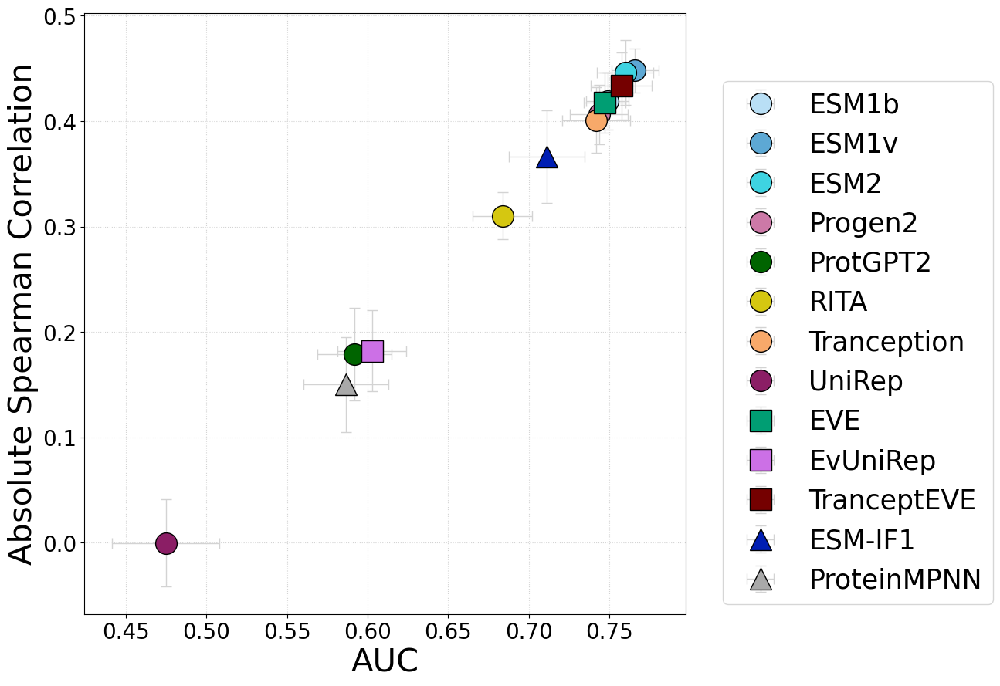

In [67]:
zsmplt.plot_metrics(zsm_module, 'VKOR1_HUMAN_Chiasson_2020_activity')

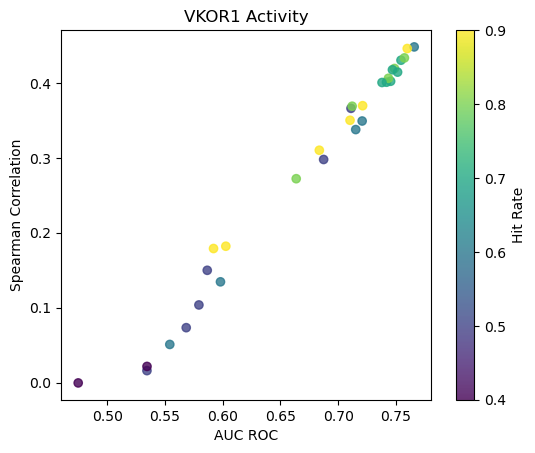

In [68]:
fig, ax = plt.subplots()
sc = ax.scatter(zsm_module.metric_results['VKOR1_HUMAN_Chiasson_2020_activity'][('auc_roc','avg')],
            zsm_module.metric_results['VKOR1_HUMAN_Chiasson_2020_activity'][('spearmanr','avg')],
            c=zsm_module.metric_results['VKOR1_HUMAN_Chiasson_2020_activity'][('hit_rate','avg')],
            alpha=0.8)
ax.set_box_aspect(1)
ax.set_ylabel('Spearman Correlation')
ax.set_xlabel('AUC ROC')
plt.colorbar(sc,label='Hit Rate')
ax.set_title('VKOR1 Activity')
plt.show()

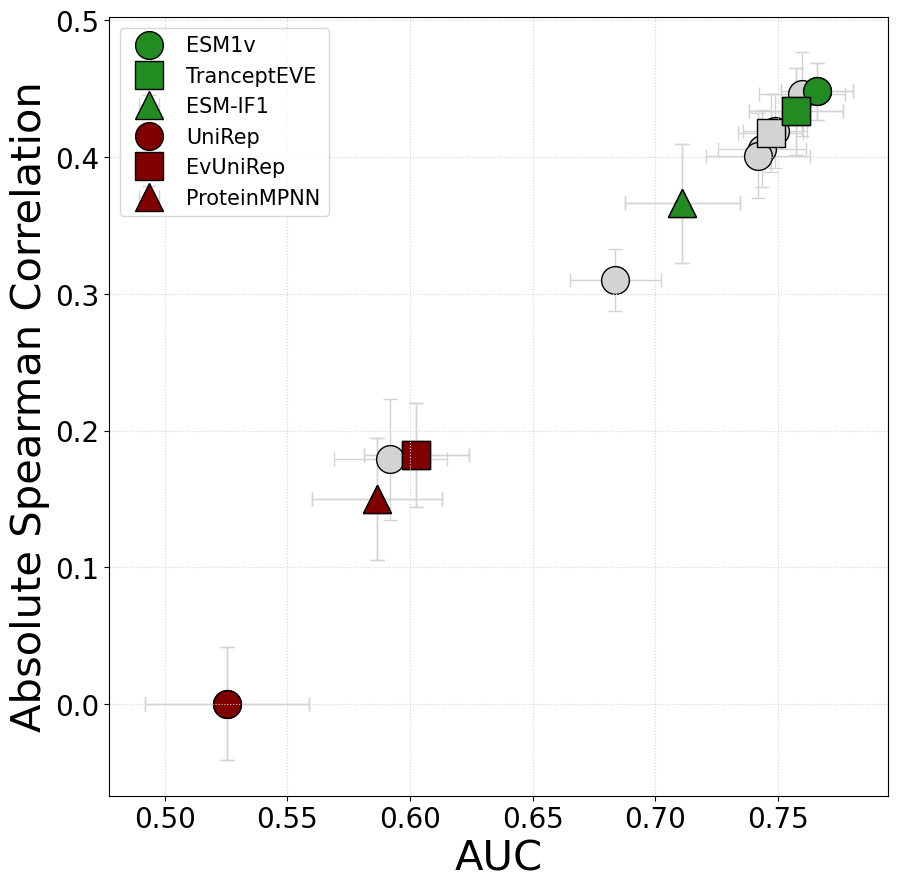

In [112]:
zsmplt.plot_metrics_cat(zsm_module, 'VKOR1_HUMAN_Chiasson_2020_activity')

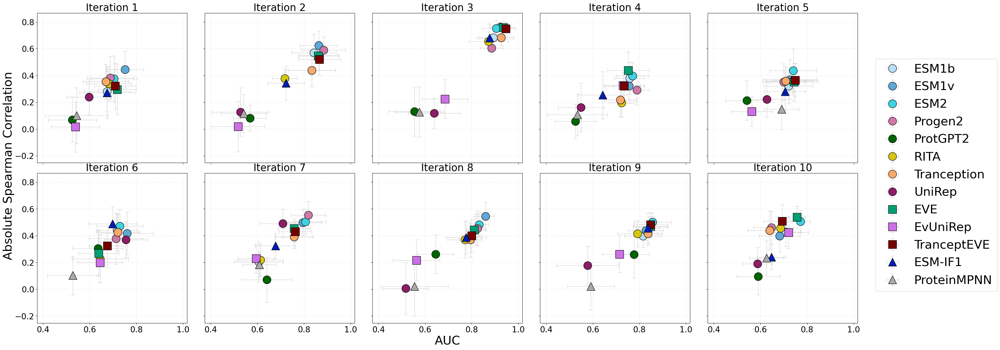

In [109]:
zsmplt.plot_metrics_iteration(zsm_module, 'VKOR1_HUMAN_Chiasson_2020_activity_selection')

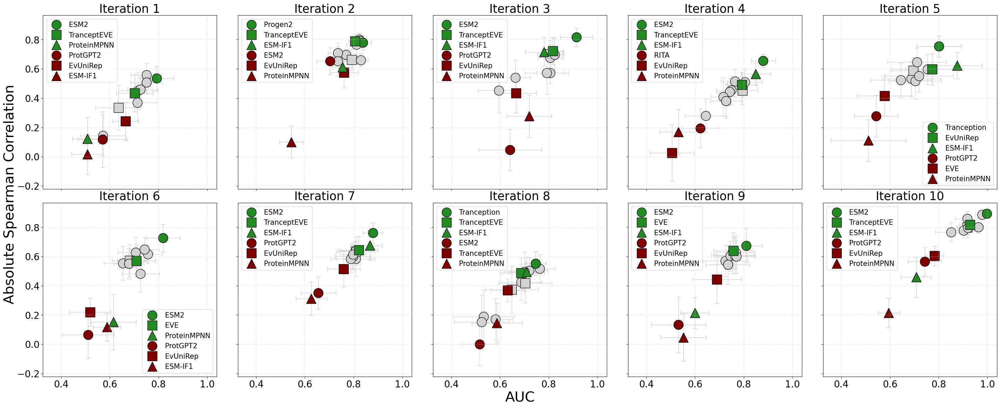

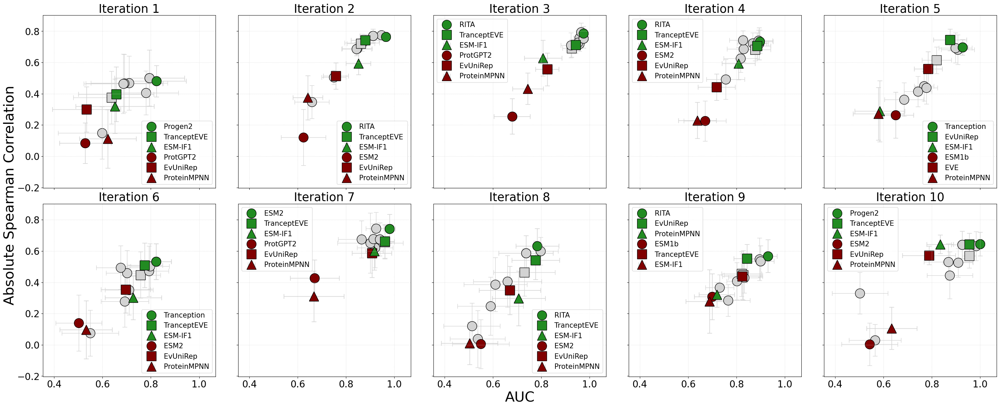

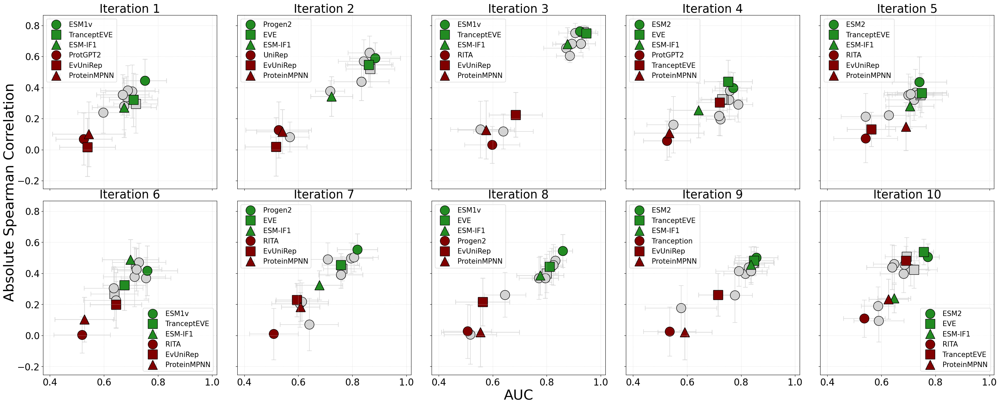

In [344]:
zsmplt.plot_metrics_cat_iteration(zsm_module, 'ANCSZ_Hobbs_2022_selection')
zsmplt.plot_metrics_cat_iteration(zsm_module, 'Q59976_STRSQ_Romero_2015_selection')
zsmplt.plot_metrics_cat_iteration(zsm_module, 'VKOR1_HUMAN_Chiasson_2020_activity_selection')

In [758]:
n_models = len(model_list)
best_model_mat = np.zeros((3,len(model_list)))
worst_model_mat = np.zeros((3,len(model_list)))
for n, dataset_name in enumerate(['ANCSZ_Hobbs_2022_selection','Q59976_STRSQ_Romero_2015_selection','VKOR1_HUMAN_Chiasson_2020_activity_selection']):
    for i, model in enumerate(model_list):
        for ite in range(10):
            best_ = zsm_module.best_models[dataset_name][f'ite{ite}']['overall']
            worst_ = zsm_module.worst_models[dataset_name][f'ite{ite}']['overall']
            if model == 'Trancept_no_ret':
                if 'Tranception_no_ret' in best_:
                    best_model_mat[n][i] += 1
                if 'Tranception_no_ret' in worst_:
                    worst_model_mat[n][i] += 1
            else:
                if model in best_:
                    best_model_mat[n][i] += 1
                if model in worst_:
                    worst_model_mat[n][i] += 1

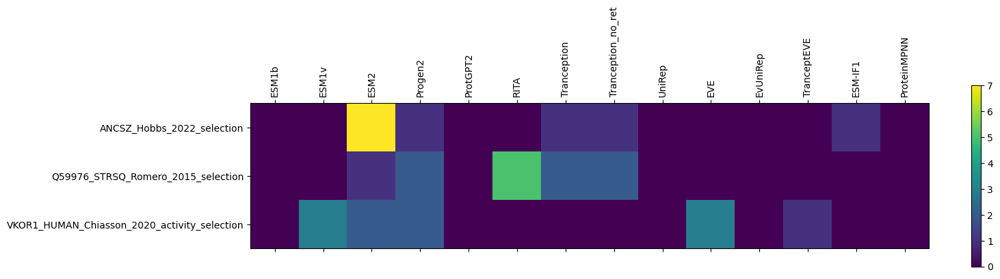

In [759]:
plt.matshow(best_model_mat)
plt.xticks(range(n_models), model_list, rotation=90)
plt.yticks(range(3), ['ANCSZ_Hobbs_2022_selection','Q59976_STRSQ_Romero_2015_selection','VKOR1_HUMAN_Chiasson_2020_activity_selection'])
plt.colorbar()
plt.show()

In [760]:
print('Best Overall Models')
for dataset_name in ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']:
    print(dataset_name)
    print(' ',zsm_module.best_models[dataset_name]['overall'])

Best Overall Models
ANCSZ_Hobbs_2022
  ESM2_650M
Q59976_STRSQ_Romero_2015
  Progen2_large
VKOR1_HUMAN_Chiasson_2020_activity
  ESM1v


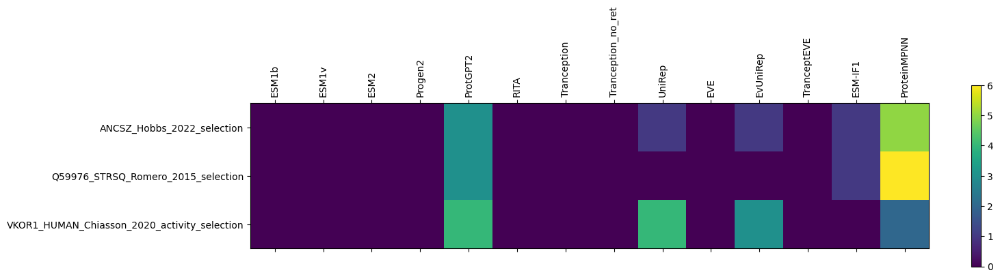

In [761]:
plt.matshow(worst_model_mat)
plt.xticks(range(n_models), model_list, rotation=90)
plt.yticks(range(3), ['ANCSZ_Hobbs_2022_selection','Q59976_STRSQ_Romero_2015_selection','VKOR1_HUMAN_Chiasson_2020_activity_selection'])
plt.colorbar()
plt.show()

In [762]:
print('Worst Overall Models')
for dataset_name in ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity']:
    print(dataset_name)
    print(' ',zsm_module.worst_models[dataset_name]['overall'])

Worst Overall Models
ANCSZ_Hobbs_2022
  ProteinMPNN
Q59976_STRSQ_Romero_2015
  ProteinMPNN
VKOR1_HUMAN_Chiasson_2020_activity
  UniRep


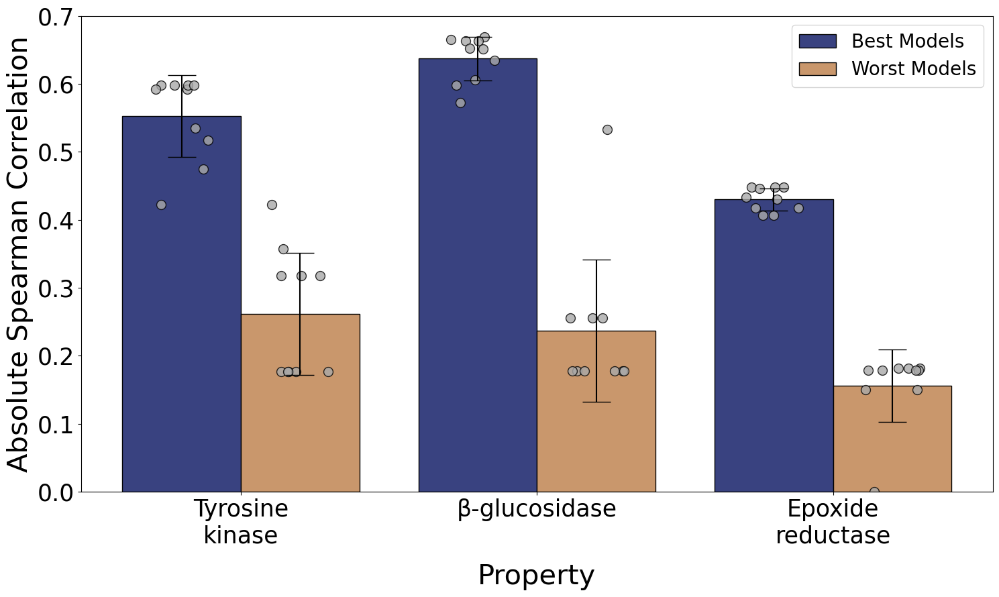

In [763]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity'],
                    metric = 'spearmanr',xlabel='Property',ylabel='Absolute Spearman Correlation',
                    alternative_names=['Tyrosine\nkinase','β-glucosidase','Epoxide\nreductase'],
                    ylimit=0.7, figsize=(15,9))

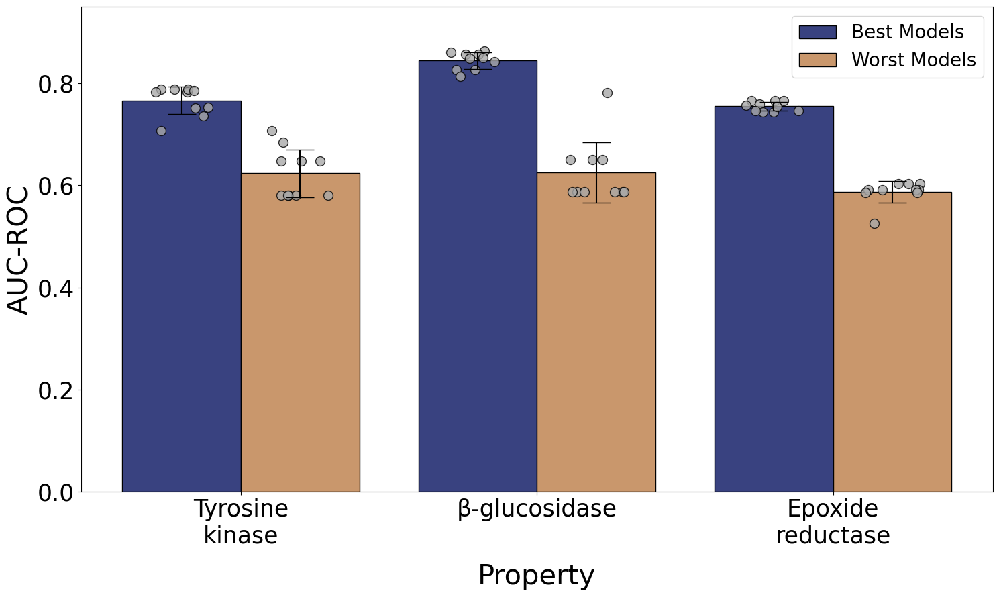

In [767]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity'],
                    metric = 'auc_roc',xlabel='Property',ylabel='AUC-ROC',
                    alternative_names=['Tyrosine\nkinase','β-glucosidase','Epoxide\nreductase'],
                    ylimit=0.95, figsize=(15,9))

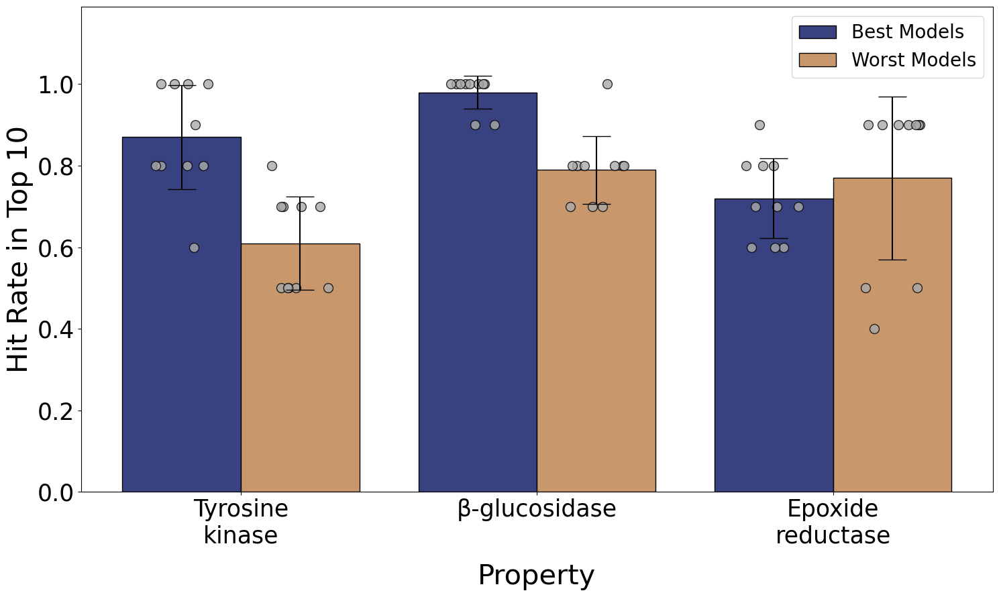

In [770]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity'],
                    metric = 'hit_rate',xlabel='Property',ylabel='Hit Rate in Top 10',
                    alternative_names=['Tyrosine\nkinase','β-glucosidase','Epoxide\nreductase'],
                    ylimit=1.19, figsize=(15,9))

## Spearman and Average Precision

In [28]:
zsm_module.compute_metrics_iterations('ANCSZ_Hobbs_2022_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('Q59976_STRSQ_Romero_2015_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('VKOR1_HUMAN_Chiasson_2020_activity_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])

zsm_module.compute_metrics('ANCSZ_Hobbs_2022',n_bootstrap=10, metrics = ['spearmanr','hit_rate','average_precision'],previous_metrics=zsm_module.metric_results['ANCSZ_Hobbs_2022_selection'])
zsm_module.compute_metrics('Q59976_STRSQ_Romero_2015',n_bootstrap=10, metrics = ['spearmanr','hit_rate','average_precision'],previous_metrics=zsm_module.metric_results['Q59976_STRSQ_Romero_2015_selection'])
zsm_module.compute_metrics('VKOR1_HUMAN_Chiasson_2020_activity',n_bootstrap=10, metrics = ['spearmanr','hit_rate','average_precision'],previous_metrics=zsm_module.metric_results['VKOR1_HUMAN_Chiasson_2020_activity_selection'])

In [29]:
zsm_module.process_models_iteration('ANCSZ_Hobbs_2022_selection')
zsm_module.process_models('ANCSZ_Hobbs_2022')

zsm_module.process_models_iteration('Q59976_STRSQ_Romero_2015_selection')
zsm_module.process_models('Q59976_STRSQ_Romero_2015')

zsm_module.process_models_iteration('VKOR1_HUMAN_Chiasson_2020_activity_selection')
zsm_module.process_models('VKOR1_HUMAN_Chiasson_2020_activity')

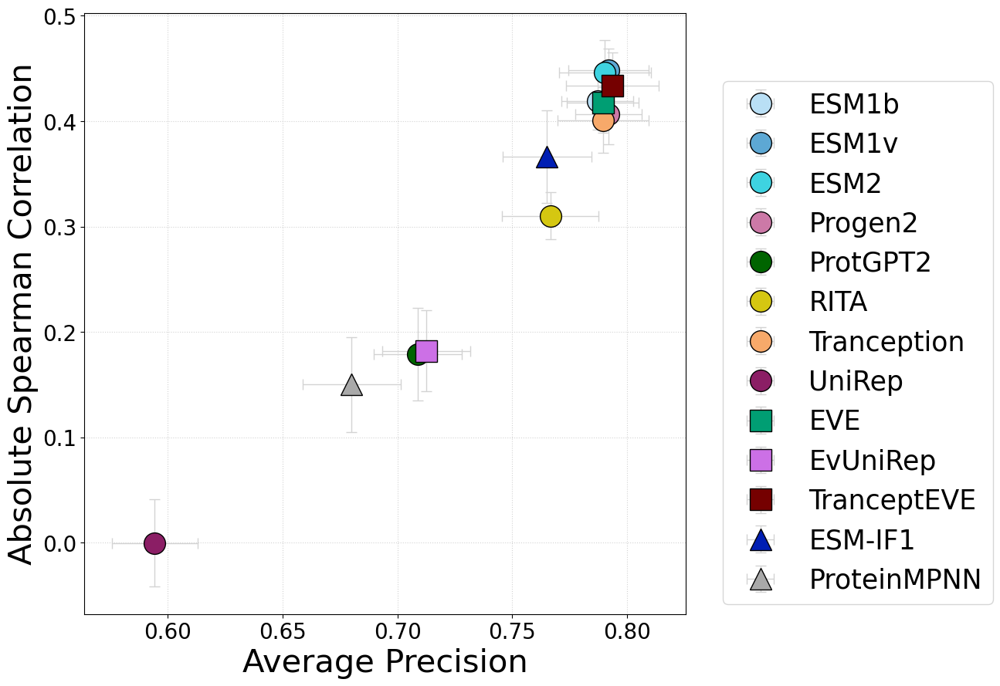

In [10]:
zsmplt.metrics(zsm_module, 'VKOR1_HUMAN_Chiasson_2020_activity')

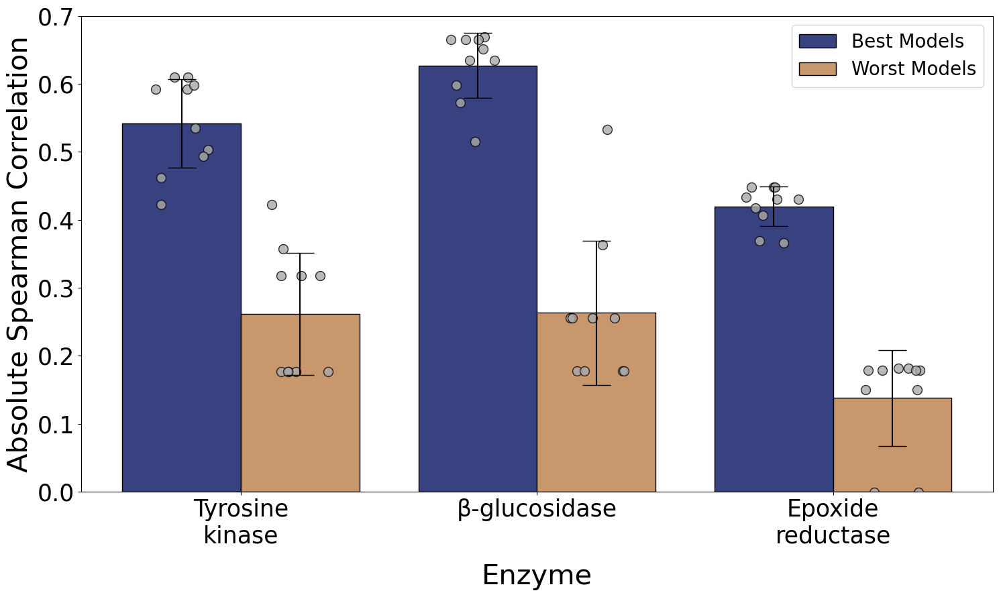

In [17]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity'],
                    metric = 'spearmanr',xlabel='Enzyme',ylabel='Absolute Spearman Correlation',
                    alternative_names=['Tyrosine\nkinase','β-glucosidase','Epoxide\nreductase'],
                    ylimit=0.7, figsize=(15,9), format='svg')

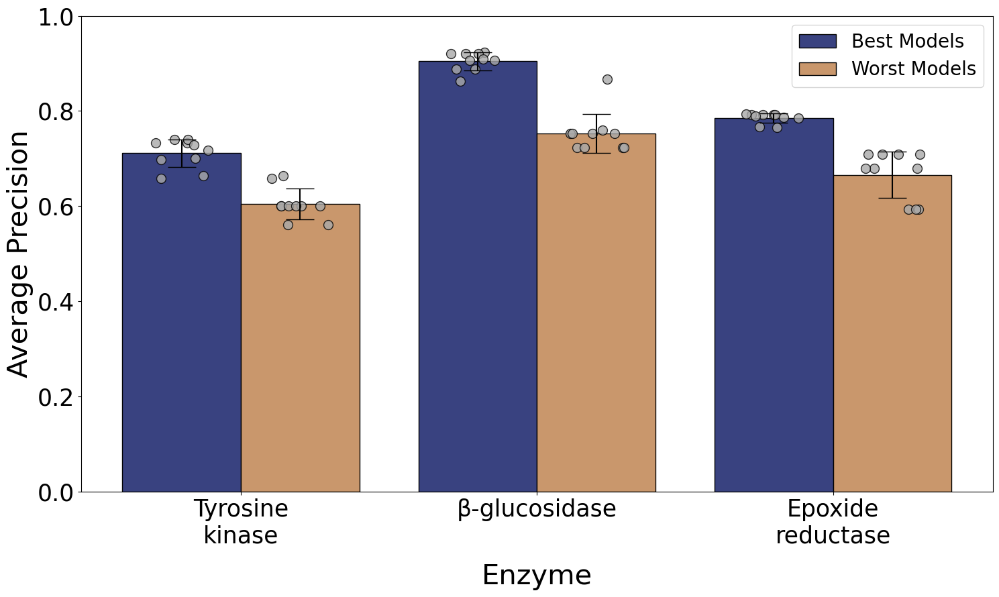

In [30]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity'],
                    metric = 'average_precision',xlabel='Enzyme',ylabel='Average Precision',
                    alternative_names=['Tyrosine\nkinase','β-glucosidase','Epoxide\nreductase'],
                    ylimit=1, figsize=(15,9), format='svg')

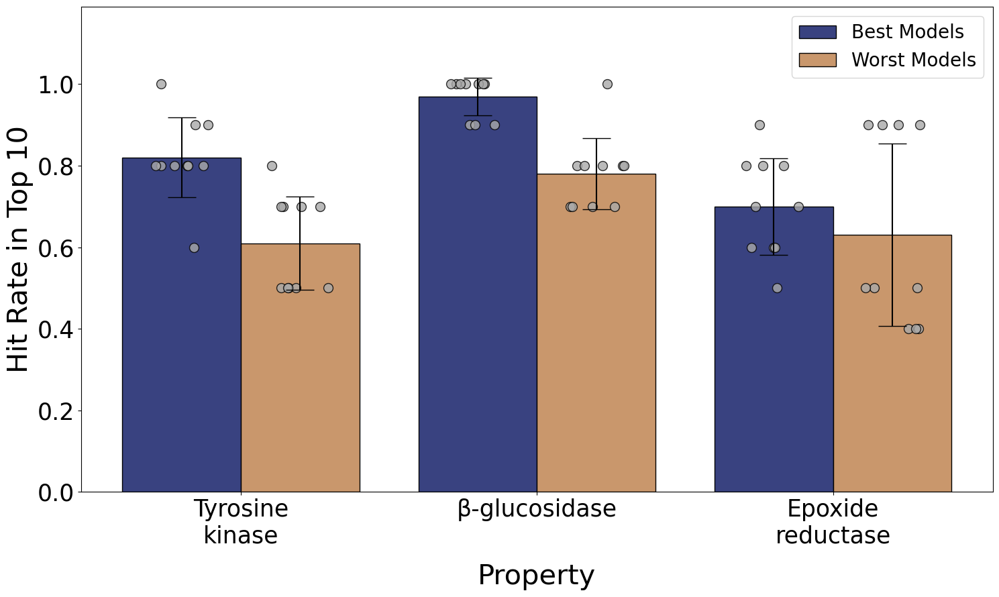

In [11]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['ANCSZ_Hobbs_2022','Q59976_STRSQ_Romero_2015','VKOR1_HUMAN_Chiasson_2020_activity'],
                    metric = 'hit_rate',xlabel='Property',ylabel='Hit Rate in Top 10',
                    alternative_names=['Tyrosine\nkinase','β-glucosidase','Epoxide\nreductase'],
                    ylimit=1.19, figsize=(15,9))

# Diversity Validation

In [5]:
zsm_module.set_threshold('A4_HUMAN_Seuma_2022_selection',-2.000000)
zsm_module.set_threshold('ADRB2_HUMAN_Jones_2020_selection',1.859962)
zsm_module.set_threshold('ESTA_BACSU_Nutschel_2020_selection',46.340000)
zsm_module.set_threshold('MK01_HUMAN_Brenan_2016_selection',-8.040791)
zsm_module.set_threshold('SC6A4_HUMAN_Young_2021_selection',-0.156069)
zsm_module.set_threshold('SPIKE_SARS2_Starr_2020_binding_selection',-0.500000)
zsm_module.set_threshold('YAP1_HUMAN_Araya_2012_selection',0.623640)
zsm_module.set_threshold('A4_HUMAN_Seuma_2022_single_selection',-2.000000)
zsm_module.set_threshold('YAP1_HUMAN_Araya_2012_single_selection',0.623640)

In [6]:
zsm_module.set_threshold('A4_HUMAN_Seuma_2022',-2.000000)
zsm_module.set_threshold('A4_HUMAN_Seuma_2022_single',-2.000000)
zsm_module.set_threshold('ADRB2_HUMAN_Jones_2020',1.859962)
zsm_module.set_threshold('ESTA_BACSU_Nutschel_2020',46.340000)
zsm_module.set_threshold('MK01_HUMAN_Brenan_2016',-8.040791)
zsm_module.set_threshold('SC6A4_HUMAN_Young_2021',-0.156069)
zsm_module.set_threshold('SPIKE_SARS2_Starr_2020_binding',-0.500000)
zsm_module.set_threshold('YAP1_HUMAN_Araya_2012',0.623640)
zsm_module.set_threshold('YAP1_HUMAN_Araya_2012_single',0.623640)

In [7]:
zsm_module.load_scores('A4_HUMAN_Seuma_2022_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('ESTA_BACSU_Nutschel_2020_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('MK01_HUMAN_Brenan_2016_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('SC6A4_HUMAN_Young_2021_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('SPIKE_SARS2_Starr_2020_binding_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('YAP1_HUMAN_Araya_2012_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('A4_HUMAN_Seuma_2022_single_selection','results/',wt=True,model_list=model_list)
zsm_module.load_scores('YAP1_HUMAN_Araya_2012_single_selection','results/',wt=True,model_list=model_list)

## Spearman and AUC

In [ ]:
zsm_module.compute_metrics_iterations('A4_HUMAN_Seuma_2022_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('ADRB2_HUMAN_Jones_2020_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('ESTA_BACSU_Nutschel_2020_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('MK01_HUMAN_Brenan_2016_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('SC6A4_HUMAN_Young_2021_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('SPIKE_SARS2_Starr_2020_binding_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('YAP1_HUMAN_Araya_2012_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('A4_HUMAN_Seuma_2022_single_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('YAP1_HUMAN_Araya_2012_single_selection',n_bootstrap=10,metrics=['spearmanr', 'auc_roc','hit_rate','average_precision'])

In [108]:
zsm_module.process_models_iteration('A4_HUMAN_Seuma_2022_selection')
zsm_module.process_models_iteration('ADRB2_HUMAN_Jones_2020_selection')
zsm_module.process_models_iteration('ESTA_BACSU_Nutschel_2020_selection')
zsm_module.process_models_iteration('MK01_HUMAN_Brenan_2016_selection')
zsm_module.process_models_iteration('SC6A4_HUMAN_Young_2021_selection')
zsm_module.process_models_iteration('SPIKE_SARS2_Starr_2020_binding_selection')
zsm_module.process_models_iteration('YAP1_HUMAN_Araya_2012_selection')
zsm_module.process_models_iteration('A4_HUMAN_Seuma_2022_single_selection')
zsm_module.process_models_iteration('YAP1_HUMAN_Araya_2012_single_selection')

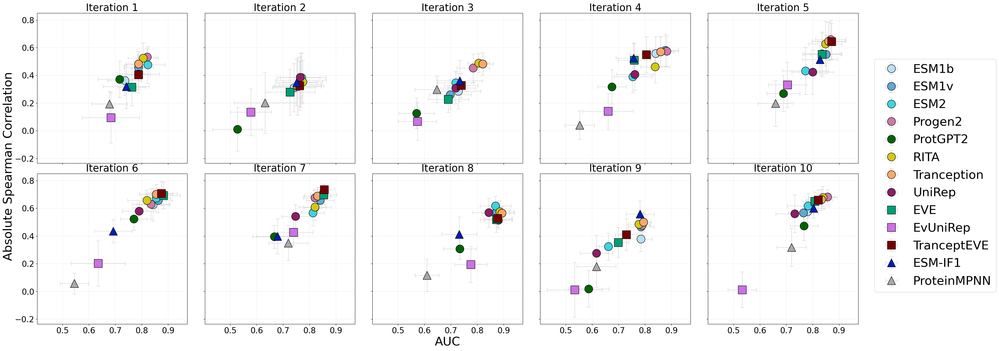

In [77]:
zsmplt.plot_metrics_iteration(zsm_module, 'ADRB2_HUMAN_Jones_2020_selection')

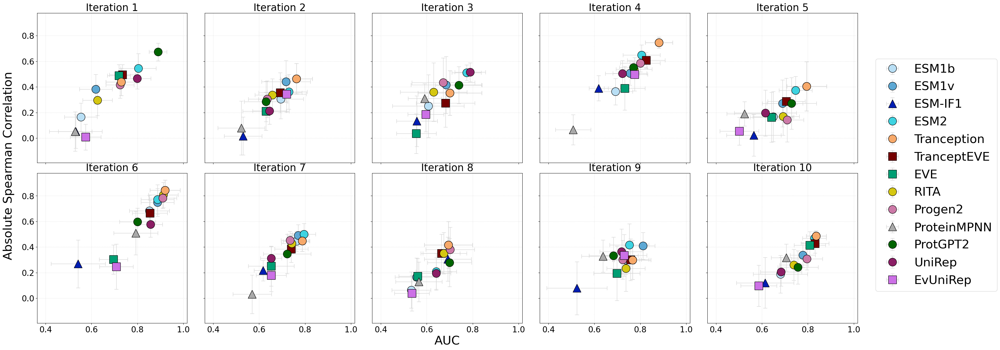

In [ ]:
zsmplt.plot_metrics_iteration(zsm_module, 'A4_HUMAN_Seuma_2022_selection')

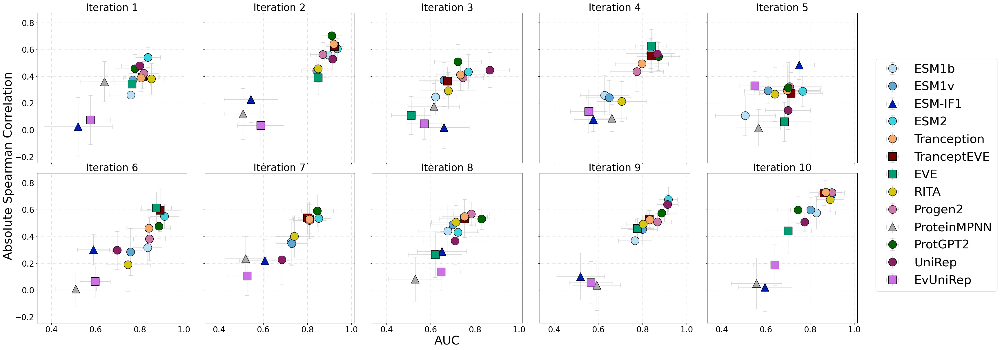

In [ ]:
zsmplt.plot_metrics_iteration(zsm_module, 'A4_HUMAN_Seuma_2022_single_selection')

In [109]:
n_models = len(model_list)
best_model_mat = np.zeros((9,len(model_list)))
worst_model_mat = np.zeros((9,len(model_list)))
for n, dataset_name in enumerate(['A4_HUMAN_Seuma_2022_selection','ADRB2_HUMAN_Jones_2020_selection','ESTA_BACSU_Nutschel_2020_selection','MK01_HUMAN_Brenan_2016_selection','SC6A4_HUMAN_Young_2021_selection','SPIKE_SARS2_Starr_2020_binding_selection','YAP1_HUMAN_Araya_2012_selection','A4_HUMAN_Seuma_2022_single_selection','YAP1_HUMAN_Araya_2012_single_selection']):
    for i, model in enumerate(model_list):
        for ite in range(10):
            best_ = zsm_module.best_models[dataset_name][f'ite{ite}']['overall']
            worst_ = zsm_module.worst_models[dataset_name][f'ite{ite}']['overall']
            if model == 'Trancept_no_ret':
                if 'Tranception_no_ret' in best_:
                    best_model_mat[n][i] += 1
                if 'Tranception_no_ret' in worst_:
                    worst_model_mat[n][i] += 1
            else:
                if model in best_:
                    best_model_mat[n][i] += 1
                if model in worst_:
                    worst_model_mat[n][i] += 1

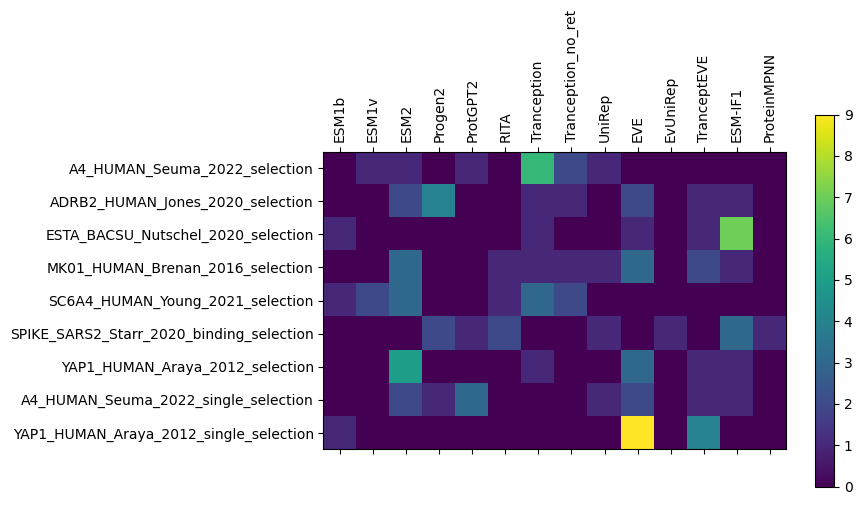

In [110]:
plt.matshow(best_model_mat)
plt.xticks(range(n_models), model_list, rotation=90)
plt.yticks(range(9), ['A4_HUMAN_Seuma_2022_selection','ADRB2_HUMAN_Jones_2020_selection','ESTA_BACSU_Nutschel_2020_selection','MK01_HUMAN_Brenan_2016_selection','SC6A4_HUMAN_Young_2021_selection','SPIKE_SARS2_Starr_2020_binding_selection','YAP1_HUMAN_Araya_2012_selection','A4_HUMAN_Seuma_2022_single_selection','YAP1_HUMAN_Araya_2012_single_selection'])
plt.colorbar()
plt.show()

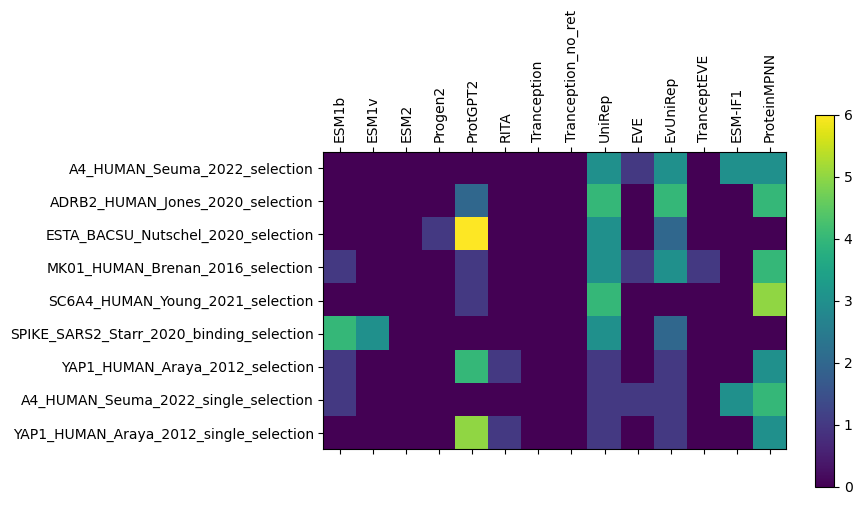

In [111]:
plt.matshow(worst_model_mat)
plt.xticks(range(n_models), model_list, rotation=90)
plt.yticks(range(9), ['A4_HUMAN_Seuma_2022_selection','ADRB2_HUMAN_Jones_2020_selection','ESTA_BACSU_Nutschel_2020_selection','MK01_HUMAN_Brenan_2016_selection','SC6A4_HUMAN_Young_2021_selection','SPIKE_SARS2_Starr_2020_binding_selection','YAP1_HUMAN_Araya_2012_selection','A4_HUMAN_Seuma_2022_single_selection','YAP1_HUMAN_Araya_2012_single_selection'])
plt.colorbar()
plt.show()

In [112]:
best_models = {}
for dataset in ['A4_HUMAN_Seuma_2022_selection','ADRB2_HUMAN_Jones_2020_selection','ESTA_BACSU_Nutschel_2020_selection','MK01_HUMAN_Brenan_2016_selection','SC6A4_HUMAN_Young_2021_selection','SPIKE_SARS2_Starr_2020_binding_selection','YAP1_HUMAN_Araya_2012_selection','A4_HUMAN_Seuma_2022_single_selection','YAP1_HUMAN_Araya_2012_single_selection']:
    models_ = np.zeros(20,dtype='object')
    for i in range(10): 
        model_ = zsm_module.best_models[dataset][f'ite{i}']['overall']
        model2_ = zsm_module.worst_models[dataset][f'ite{i}']['overall']
        if 'Tranception_no' in model_:
            models_[i] = 'Tranception_no_ret'
        else:
            models_[i] = model_.split('_')[0]
        if 'Tranception_no' in model2_:
            models_[i+10] = 'Tranception_no_ret'
        else:
            models_[i+10] = model2_.split('_')[0]
    print(dataset,np.unique(models_))
    best_models[dataset] = models_



A4_HUMAN_Seuma_2022_selection ['ESM-IF1' 'ESM1v' 'ESM2' 'EVE' 'EvUniRep' 'ProtGPT2' 'ProteinMPNN'
 'Tranception' 'Tranception_no_ret' 'UniRep']
ADRB2_HUMAN_Jones_2020_selection ['ESM-IF1' 'ESM2' 'EVE' 'EvUniRep' 'Progen2' 'ProtGPT2' 'ProteinMPNN'
 'TranceptEVE' 'Tranception_no_ret']
ESTA_BACSU_Nutschel_2020_selection ['ESM-IF1' 'ESM1b' 'EvUniRep' 'Progen2' 'ProtGPT2' 'TranceptEVE'
 'Tranception' 'UniRep']
MK01_HUMAN_Brenan_2016_selection ['ESM-IF1' 'ESM1b' 'ESM2' 'EVE' 'EvUniRep' 'ProtGPT2' 'ProteinMPNN' 'RITA'
 'TranceptEVE' 'Tranception_no_ret' 'UniRep']
SC6A4_HUMAN_Young_2021_selection ['ESM1b' 'ESM1v' 'ESM2' 'ProtGPT2' 'ProteinMPNN' 'RITA' 'Tranception'
 'Tranception_no_ret' 'UniRep']
SPIKE_SARS2_Starr_2020_binding_selection ['ESM-IF1' 'ESM1b' 'ESM1v' 'EvUniRep' 'Progen2' 'ProtGPT2' 'ProteinMPNN'
 'RITA' 'UniRep']
YAP1_HUMAN_Araya_2012_selection ['ESM-IF1' 'ESM1b' 'ESM2' 'EVE' 'EvUniRep' 'ProtGPT2' 'ProteinMPNN' 'RITA'
 'TranceptEVE' 'Tranception']
A4_HUMAN_Seuma_2022_single_select

In [114]:
zsm_module.load_scores('A4_HUMAN_Seuma_2022','results/',wt=True,model_list=best_models['A4_HUMAN_Seuma_2022_selection'])
zsm_module.load_scores('A4_HUMAN_Seuma_2022','results/',wt=True,model_list=best_models['A4_HUMAN_Seuma_2022_single_selection'],dict_name='A4_HUMAN_Seuma_2022_single')
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020','results/',wt=True,model_list=best_models['ADRB2_HUMAN_Jones_2020_selection'])
zsm_module.load_scores('ESTA_BACSU_Nutschel_2020','results/',wt=True,model_list=best_models['ESTA_BACSU_Nutschel_2020_selection'])
zsm_module.load_scores('MK01_HUMAN_Brenan_2016','results/',wt=True,model_list=best_models['MK01_HUMAN_Brenan_2016_selection'])
zsm_module.load_scores('SC6A4_HUMAN_Young_2021','results/',wt=True,model_list=best_models['SC6A4_HUMAN_Young_2021_selection'])
zsm_module.load_scores('SPIKE_SARS2_Starr_2020_binding','results/',wt=True,model_list=best_models['SPIKE_SARS2_Starr_2020_binding_selection'])
zsm_module.load_scores('YAP1_HUMAN_Araya_2012','results/',wt=True,model_list=best_models['YAP1_HUMAN_Araya_2012_selection'])
zsm_module.load_scores('YAP1_HUMAN_Araya_2012','results/',wt=True,model_list=best_models['YAP1_HUMAN_Araya_2012_single_selection'],dict_name='YAP1_HUMAN_Araya_2012_single')


In [115]:
zsm_module.compute_metrics('A4_HUMAN_Seuma_2022',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['A4_HUMAN_Seuma_2022_selection'])
zsm_module.compute_metrics('A4_HUMAN_Seuma_2022_single',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['A4_HUMAN_Seuma_2022_single_selection'])
zsm_module.compute_metrics('ADRB2_HUMAN_Jones_2020',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['ADRB2_HUMAN_Jones_2020_selection'])
zsm_module.compute_metrics('ESTA_BACSU_Nutschel_2020',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['ESTA_BACSU_Nutschel_2020_selection'])
zsm_module.compute_metrics('MK01_HUMAN_Brenan_2016',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['MK01_HUMAN_Brenan_2016_selection'])
zsm_module.compute_metrics('SC6A4_HUMAN_Young_2021',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['SC6A4_HUMAN_Young_2021_selection'])
zsm_module.compute_metrics('SPIKE_SARS2_Starr_2020_binding',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['SPIKE_SARS2_Starr_2020_binding_selection'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['YAP1_HUMAN_Araya_2012_selection'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012_single',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'],previous_metrics=zsm_module.metric_results['YAP1_HUMAN_Araya_2012_single_selection'])

In [116]:
zsm_module.process_models('A4_HUMAN_Seuma_2022')
zsm_module.process_models('A4_HUMAN_Seuma_2022_single')
zsm_module.process_models('ADRB2_HUMAN_Jones_2020')
zsm_module.process_models('ESTA_BACSU_Nutschel_2020')
zsm_module.process_models('MK01_HUMAN_Brenan_2016')
zsm_module.process_models('SC6A4_HUMAN_Young_2021')
zsm_module.process_models('SPIKE_SARS2_Starr_2020_binding')
zsm_module.process_models('YAP1_HUMAN_Araya_2012')
zsm_module.process_models('YAP1_HUMAN_Araya_2012_single')

No models found for MSA for SC6A4_HUMAN_Young_2021.


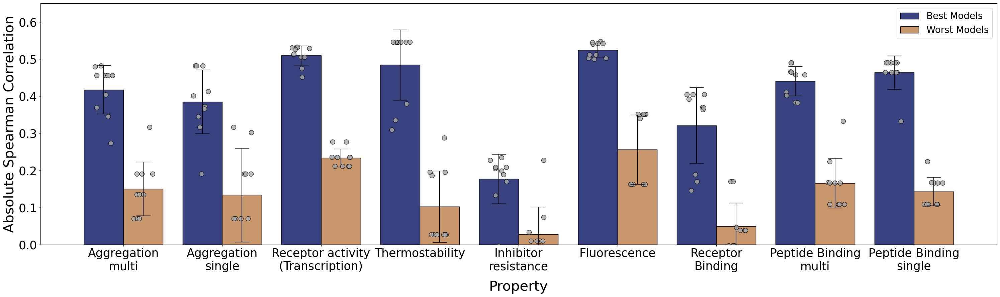

In [98]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022','A4_HUMAN_Seuma_2022_single','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012','YAP1_HUMAN_Araya_2012_single'],
                    metric = 'spearmanr',xlabel='Property',ylabel='Absolute Spearman Correlation',
                    alternative_names=['Aggregation\nmulti','Aggregation\nsingle','Receptor activity\n(Transcription)','Thermostability','Inhibitor\nresistance',
                                       'Fluorescence','Receptor\nBinding','Peptide Binding\nmulti','Peptide Binding\nsingle'],
                                       ylimit=0.65, figsize=(30,9))

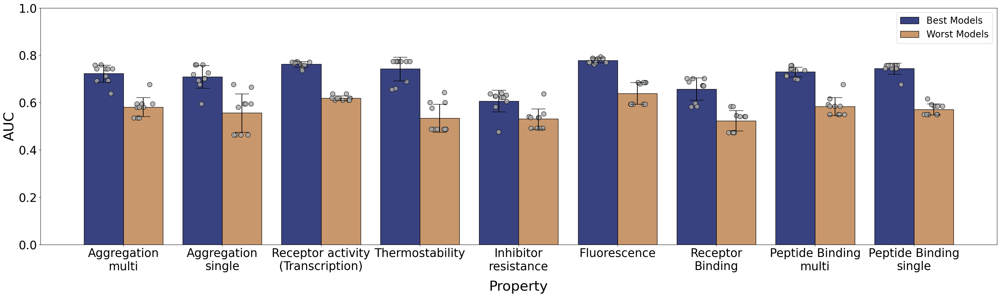

In [99]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022','A4_HUMAN_Seuma_2022_single','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012','YAP1_HUMAN_Araya_2012_single'],
                    metric = 'auc_roc',xlabel='Property',ylabel='AUC',
                    alternative_names=['Aggregation\nmulti','Aggregation\nsingle','Receptor activity\n(Transcription)','Thermostability','Inhibitor\nresistance',
                                       'Fluorescence','Receptor\nBinding','Peptide Binding\nmulti','Peptide Binding\nsingle'],
                                       ylimit=1, figsize=(30,9))

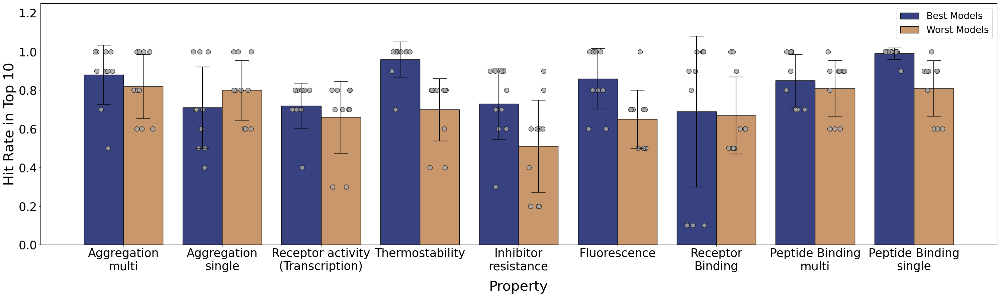

In [100]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022','A4_HUMAN_Seuma_2022_single','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012','YAP1_HUMAN_Araya_2012_single'],
                    metric = 'hit_rate',xlabel='Property',ylabel='Hit Rate in Top 10',
                    alternative_names=['Aggregation\nmulti','Aggregation\nsingle','Receptor activity\n(Transcription)','Thermostability','Inhibitor\nresistance',
                                       'Fluorescence','Receptor\nBinding','Peptide Binding\nmulti','Peptide Binding\nsingle'],
                                       ylimit=1.25, figsize=(30,9))

## Spearman and Average Precision

In [8]:
zsm_module.compute_metrics_iterations('A4_HUMAN_Seuma_2022_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('ADRB2_HUMAN_Jones_2020_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('ESTA_BACSU_Nutschel_2020_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('MK01_HUMAN_Brenan_2016_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('SC6A4_HUMAN_Young_2021_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('SPIKE_SARS2_Starr_2020_binding_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('YAP1_HUMAN_Araya_2012_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('A4_HUMAN_Seuma_2022_single_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])
zsm_module.compute_metrics_iterations('YAP1_HUMAN_Araya_2012_single_selection',n_bootstrap=10,metrics=['spearmanr','hit_rate','average_precision'])

In [9]:
zsm_module.process_models_iteration('A4_HUMAN_Seuma_2022_selection')
zsm_module.process_models_iteration('ADRB2_HUMAN_Jones_2020_selection')
zsm_module.process_models_iteration('ESTA_BACSU_Nutschel_2020_selection')
zsm_module.process_models_iteration('MK01_HUMAN_Brenan_2016_selection')
zsm_module.process_models_iteration('SC6A4_HUMAN_Young_2021_selection')
zsm_module.process_models_iteration('SPIKE_SARS2_Starr_2020_binding_selection')
zsm_module.process_models_iteration('YAP1_HUMAN_Araya_2012_selection')
zsm_module.process_models_iteration('A4_HUMAN_Seuma_2022_single_selection')
zsm_module.process_models_iteration('YAP1_HUMAN_Araya_2012_single_selection')

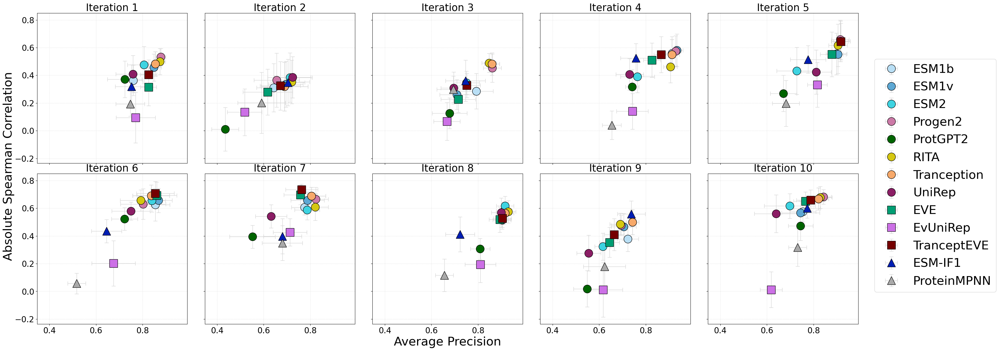

In [10]:
zsmplt.metrics_iteration(zsm_module, 'ADRB2_HUMAN_Jones_2020_selection')

In [12]:
n_models = len(model_list)
best_model_mat = np.zeros((9,len(model_list)))
worst_model_mat = np.zeros((9,len(model_list)))
for n, dataset_name in enumerate(['A4_HUMAN_Seuma_2022_selection','ADRB2_HUMAN_Jones_2020_selection','ESTA_BACSU_Nutschel_2020_selection','MK01_HUMAN_Brenan_2016_selection','SC6A4_HUMAN_Young_2021_selection','SPIKE_SARS2_Starr_2020_binding_selection','YAP1_HUMAN_Araya_2012_selection','A4_HUMAN_Seuma_2022_single_selection','YAP1_HUMAN_Araya_2012_single_selection']):
    for i, model in enumerate(model_list):
        for ite in range(10):
            best_ = zsm_module.best_models[dataset_name][f'ite{ite}']['overall']
            worst_ = zsm_module.worst_models[dataset_name][f'ite{ite}']['overall']
            if model == 'Trancept_no_ret':
                if 'Tranception_no_ret' in best_:
                    best_model_mat[n][i] += 1
                if 'Tranception_no_ret' in worst_:
                    worst_model_mat[n][i] += 1
            else:
                if model in best_:
                    best_model_mat[n][i] += 1
                if model in worst_:
                    worst_model_mat[n][i] += 1

In [13]:
best_models = {}
for dataset in ['A4_HUMAN_Seuma_2022_selection','ADRB2_HUMAN_Jones_2020_selection','ESTA_BACSU_Nutschel_2020_selection','MK01_HUMAN_Brenan_2016_selection','SC6A4_HUMAN_Young_2021_selection','SPIKE_SARS2_Starr_2020_binding_selection','YAP1_HUMAN_Araya_2012_selection','A4_HUMAN_Seuma_2022_single_selection','YAP1_HUMAN_Araya_2012_single_selection']:
    models_ = np.zeros(20,dtype='object')
    for i in range(10): 
        model_ = zsm_module.best_models[dataset][f'ite{i}']['overall']
        model2_ = zsm_module.worst_models[dataset][f'ite{i}']['overall']
        if 'Tranception_no' in model_:
            models_[i] = 'Tranception_no_ret'
        else:
            models_[i] = model_.split('_')[0]
        if 'Tranception_no' in model2_:
            models_[i+10] = 'Tranception_no_ret'
        else:
            models_[i+10] = model2_.split('_')[0]
    print(dataset,np.unique(models_))
    best_models[dataset] = models_

A4_HUMAN_Seuma_2022_selection ['ESM-IF1' 'ESM1b' 'ESM1v' 'ESM2' 'EVE' 'EvUniRep' 'ProtGPT2'
 'ProteinMPNN' 'Tranception' 'Tranception_no_ret' 'UniRep']
ADRB2_HUMAN_Jones_2020_selection ['ESM-IF1' 'ESM1v' 'ESM2' 'EVE' 'EvUniRep' 'Progen2' 'ProtGPT2'
 'ProteinMPNN' 'Tranception_no_ret' 'UniRep']
ESTA_BACSU_Nutschel_2020_selection ['ESM-IF1' 'EvUniRep' 'ProtGPT2' 'RITA' 'TranceptEVE' 'UniRep']
MK01_HUMAN_Brenan_2016_selection ['ESM-IF1' 'ESM2' 'EVE' 'EvUniRep' 'ProtGPT2' 'ProteinMPNN' 'RITA'
 'TranceptEVE' 'Tranception_no_ret' 'UniRep']
SC6A4_HUMAN_Young_2021_selection ['ESM-IF1' 'ESM1b' 'ESM1v' 'ESM2' 'EvUniRep' 'ProtGPT2' 'ProteinMPNN'
 'RITA' 'TranceptEVE' 'Tranception_no_ret' 'UniRep']
SPIKE_SARS2_Starr_2020_binding_selection ['ESM-IF1' 'ESM1b' 'ESM1v' 'EvUniRep' 'Progen2' 'ProtGPT2' 'ProteinMPNN'
 'RITA' 'UniRep']
YAP1_HUMAN_Araya_2012_selection ['ESM-IF1' 'ESM2' 'EVE' 'ProtGPT2' 'ProteinMPNN' 'RITA' 'TranceptEVE'
 'Tranception' 'UniRep']
A4_HUMAN_Seuma_2022_single_selection ['ESM-IF

YAP1_HUMAN_Araya_2012 missing Progen2

In [22]:
zsm_module.load_scores('A4_HUMAN_Seuma_2022','results/',wt=True,model_list=model_list)
zsm_module.load_scores('A4_HUMAN_Seuma_2022','results/',wt=True,model_list=model_list,dict_name='A4_HUMAN_Seuma_2022_single')
zsm_module.load_scores('ADRB2_HUMAN_Jones_2020','results/',wt=True,model_list=model_list)
zsm_module.load_scores('ESTA_BACSU_Nutschel_2020','results/',wt=True,model_list=model_list)
zsm_module.load_scores('MK01_HUMAN_Brenan_2016','results/',wt=True,model_list=model_list)
zsm_module.load_scores('SC6A4_HUMAN_Young_2021','results/',wt=True,model_list=model_list)
zsm_module.load_scores('SPIKE_SARS2_Starr_2020_binding','results/',model_list=model_list)
zsm_module.load_scores('YAP1_HUMAN_Araya_2012','results/',wt=True,model_list=model_list)
zsm_module.load_scores('YAP1_HUMAN_Araya_2012','results/',wt=True,model_list=model_list,dict_name='YAP1_HUMAN_Araya_2012_single')

In [23]:
zsm_module.compute_metrics('A4_HUMAN_Seuma_2022',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['A4_HUMAN_Seuma_2022_selection'])
zsm_module.compute_metrics('A4_HUMAN_Seuma_2022_single',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['A4_HUMAN_Seuma_2022_single_selection'])
zsm_module.compute_metrics('ADRB2_HUMAN_Jones_2020',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['ADRB2_HUMAN_Jones_2020_selection'])
zsm_module.compute_metrics('ESTA_BACSU_Nutschel_2020',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['ESTA_BACSU_Nutschel_2020_selection'])
zsm_module.compute_metrics('MK01_HUMAN_Brenan_2016',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['MK01_HUMAN_Brenan_2016_selection'])
zsm_module.compute_metrics('SC6A4_HUMAN_Young_2021',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['SC6A4_HUMAN_Young_2021_selection'])
zsm_module.compute_metrics('SPIKE_SARS2_Starr_2020_binding',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['SPIKE_SARS2_Starr_2020_binding_selection'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['YAP1_HUMAN_Araya_2012_selection'])
zsm_module.compute_metrics('YAP1_HUMAN_Araya_2012_single',n_bootstrap=10, metrics = ['spearmanr', 'average_precision','hit_rate'],previous_metrics=zsm_module.metric_results['YAP1_HUMAN_Araya_2012_single_selection'])

In [24]:
zsm_module.process_models('A4_HUMAN_Seuma_2022')
zsm_module.process_models('A4_HUMAN_Seuma_2022_single')
zsm_module.process_models('ADRB2_HUMAN_Jones_2020')
zsm_module.process_models('ESTA_BACSU_Nutschel_2020')
zsm_module.process_models('MK01_HUMAN_Brenan_2016')
zsm_module.process_models('SC6A4_HUMAN_Young_2021')
zsm_module.process_models('SPIKE_SARS2_Starr_2020_binding')
zsm_module.process_models('YAP1_HUMAN_Araya_2012')
zsm_module.process_models('YAP1_HUMAN_Araya_2012_single')

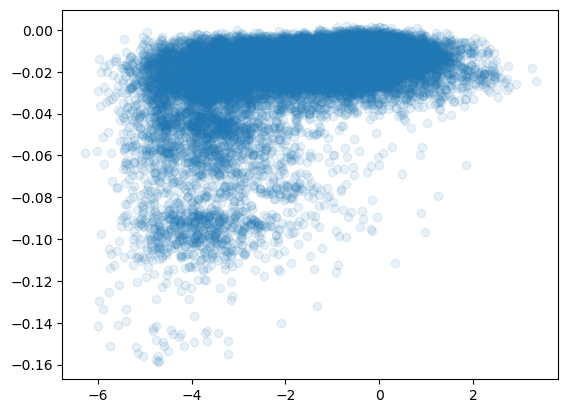

In [19]:
plt.scatter(zsm_module.datasets['A4_HUMAN_Seuma_2022']['exp_data'].DMS_score,zsm_module.datasets['A4_HUMAN_Seuma_2022']['Tranception_S']['Tranception_S'],alpha=0.1)

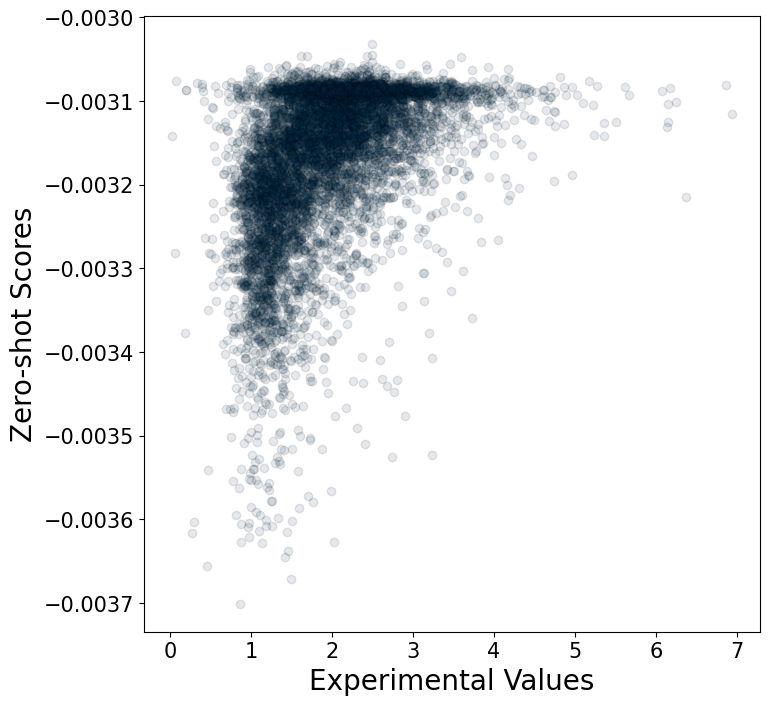

In [20]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.scatter(zsm_module.datasets['ADRB2_HUMAN_Jones_2020']['exp_data'].DMS_score,zsm_module.datasets['ADRB2_HUMAN_Jones_2020']['Progen2_medium']['Progen2_medium'],alpha=0.1,color='#003052',edgecolor='k')
ax.set_box_aspect(1)
ax.set_xlabel('Experimental Values',fontsize=20)
ax.set_ylabel('Zero-shot Scores',fontsize=20)
ax.tick_params(labelsize=15)

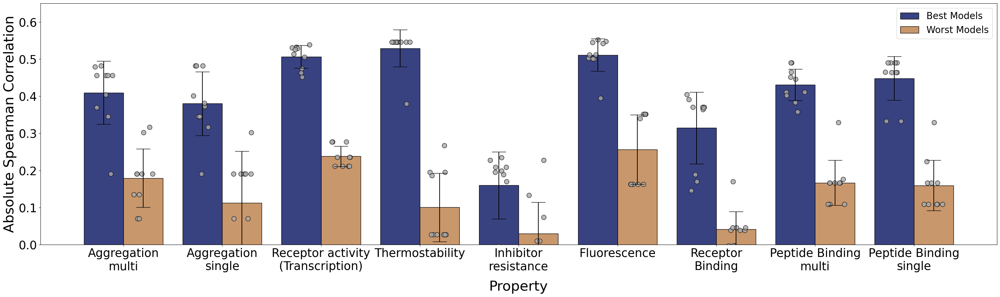

In [25]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022','A4_HUMAN_Seuma_2022_single','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012','YAP1_HUMAN_Araya_2012_single'],
                    metric = 'spearmanr',xlabel='Property',ylabel='Absolute Spearman Correlation',
                    alternative_names=['Aggregation\nmulti','Aggregation\nsingle','Receptor activity\n(Transcription)','Thermostability','Inhibitor\nresistance',
                                       'Fluorescence','Receptor\nBinding','Peptide Binding\nmulti','Peptide Binding\nsingle'],
                                       ylimit=0.65, figsize=(30,9), custom_name='diverse_properties')

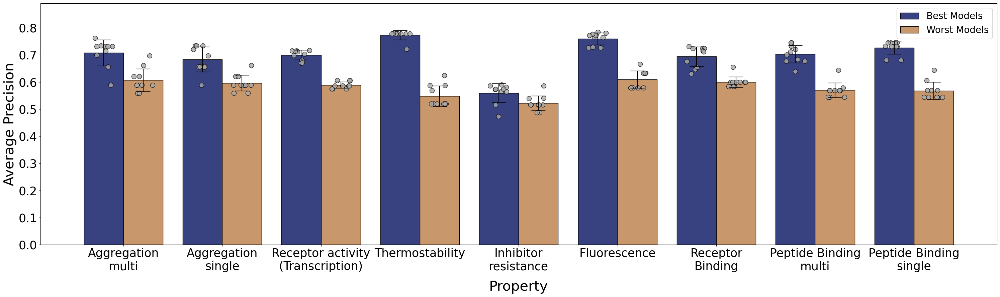

In [26]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022','A4_HUMAN_Seuma_2022_single','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012','YAP1_HUMAN_Araya_2012_single'],
                    metric = 'average_precision',xlabel='Property',ylabel='Average Precision',
                    alternative_names=['Aggregation\nmulti','Aggregation\nsingle','Receptor activity\n(Transcription)','Thermostability','Inhibitor\nresistance',
                                       'Fluorescence','Receptor\nBinding','Peptide Binding\nmulti','Peptide Binding\nsingle'],
                                       ylimit=0.89, figsize=(30,9), custom_name='diverse_properties',format='svg')

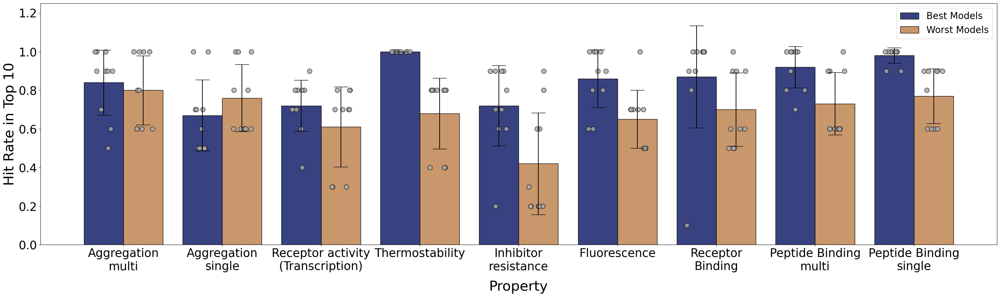

In [21]:
zsmplt.bar_metrics(zsm_module,dataset_names = ['A4_HUMAN_Seuma_2022','A4_HUMAN_Seuma_2022_single','ADRB2_HUMAN_Jones_2020','ESTA_BACSU_Nutschel_2020','MK01_HUMAN_Brenan_2016',
                                               'SC6A4_HUMAN_Young_2021','SPIKE_SARS2_Starr_2020_binding','YAP1_HUMAN_Araya_2012','YAP1_HUMAN_Araya_2012_single'],
                    metric = 'hit_rate',xlabel='Property',ylabel='Hit Rate in Top 10',
                    alternative_names=['Aggregation\nmulti','Aggregation\nsingle','Receptor activity\n(Transcription)','Thermostability','Inhibitor\nresistance',
                                       'Fluorescence','Receptor\nBinding','Peptide Binding\nmulti','Peptide Binding\nsingle'],
                                       ylimit=1.25, figsize=(30,9), custom_name='diverse_properties')

# Flourinase

In [748]:
zsm_module.set_threshold('FlA_HIM_RelAct',80)
zsm_module.set_threshold('FlA_HIM_SMscan_full',80)

In [749]:
#model_list = ['ESM1b','ESM1v','ESM-IF1','ESM2','Tranception_no_ret','TranceptEVE','EVE','RITA','Progen2','Tranception','ProteinMPNN','ProtGPT2','UniRep','EvUniRep']
zsm_module.load_scores('FlA_HIM_RelAct','/Users/dahala/GitHub/FluorinaseML/results/',model_list)

In [750]:
zsm_module.compute_metrics('FlA_HIM_RelAct',n_bootstrap=1000, metrics = ['spearmanr', 'auc_roc','hit_rate'])

In [751]:
zsm_module.process_models('FlA_HIM_RelAct')

KeyError: 'FlA_HIM_RelAct'

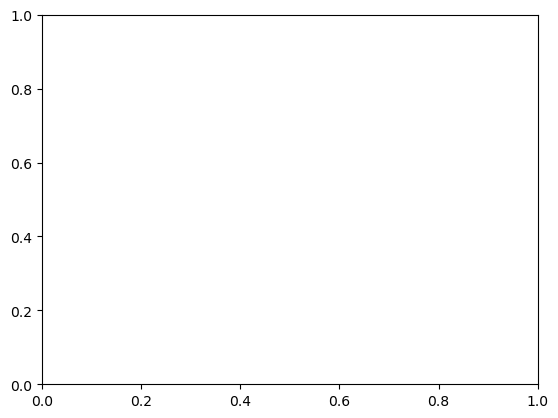

In [ ]:
fig, ax = plt.subplots()
ax.scatter(zsm_module.metric_results['FlA_HIM_RelAct'][('spearmanr','avg')],
            zsm_module.metric_results['FlA_HIM_RelAct'][('auc_roc','avg')],
            c=zsm_module.metric_results['FlA_HIM_RelAct'][('hit_rate','avg')],
            alpha=0.8)
ax.set_box_aspect(1)
ax.set_xlabel('Spearman Correlation')
ax.set_ylabel('AUC ROC')
plt.show

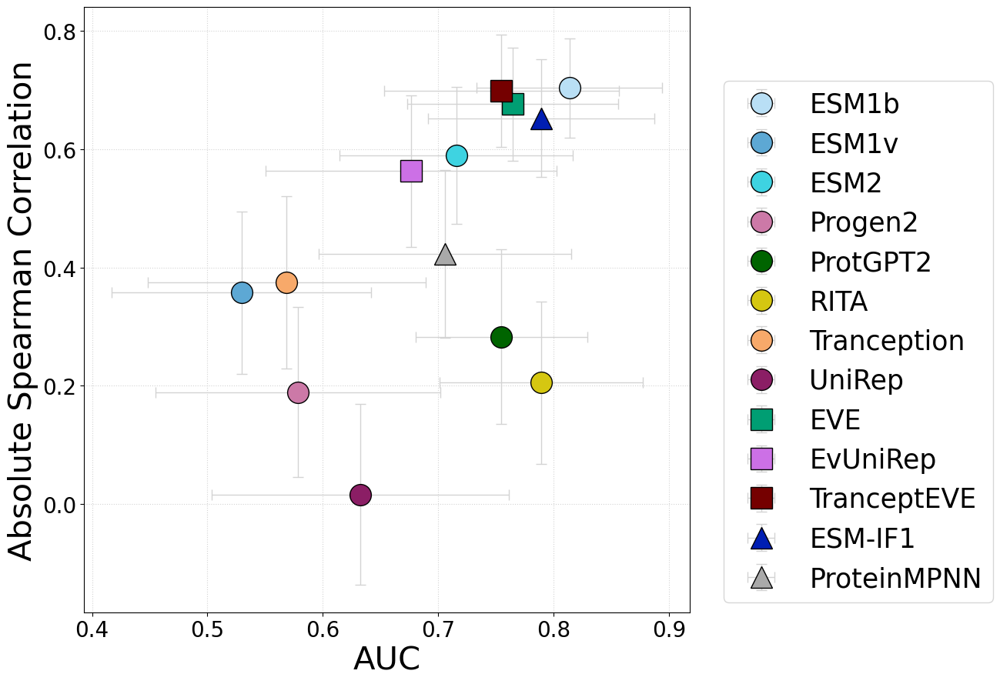

In [771]:
zsmplt.plot_metrics(zsm_module, 'FlA_HIM_RelAct')

In [556]:
best_models = [zsm_module.best_models['FlA_HIM_RelAct'][cat] for cat in ['sequence','MSA','structure']]

In [557]:
model_list = ['ESM1b','TranceptEVE','ESM-IF1']
zsm_module.load_scores('FlA_HIM_SMscan_full','/Users/dahala/GitHub/FluorinaseML/results/',model_list,wt=True)

In [558]:
FlA_ranking = zsm_module.sorting_mutants('FlA_HIM_SMscan_full',best_models,'ESM1b','/Users/dahala/GitHub/ZeroShotValidation/',wt=True)

In [559]:
for model in best_models:
    zsm_module.sm_landscape('FlA_HIM_SMscan_full',model,wt=True)

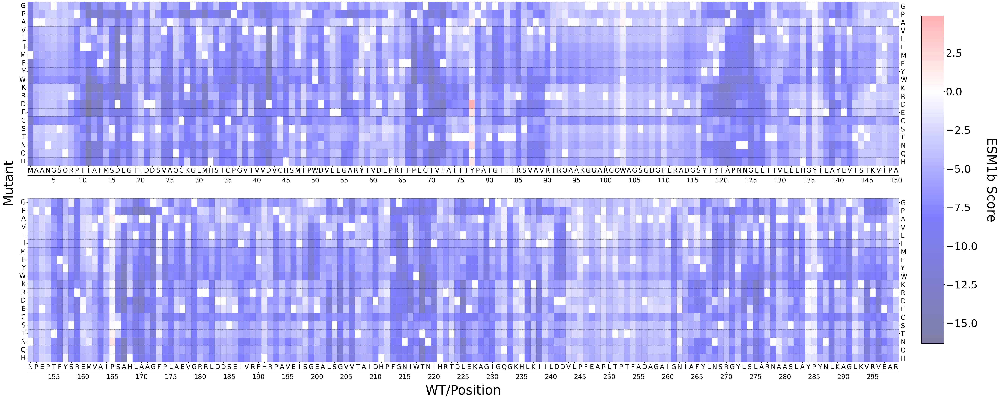

In [560]:
zsmplt.plot_heatmap(zsm_module, 'FlA_HIM_SMscan_full', 'ESM1b', 2, 'ESM1b Score', '/Users/dahala/GitHub/ZeroShotValidation/figures')

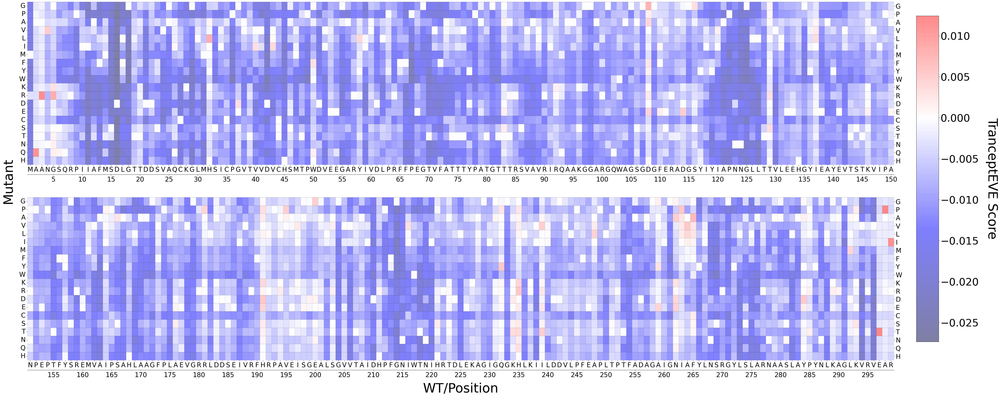

In [561]:
zsmplt.plot_heatmap(zsm_module, 'FlA_HIM_SMscan_full', 'TranceptEVE_M', 2, 'TranceptEVE Score', '/Users/dahala/GitHub/ZeroShotValidation/figures')

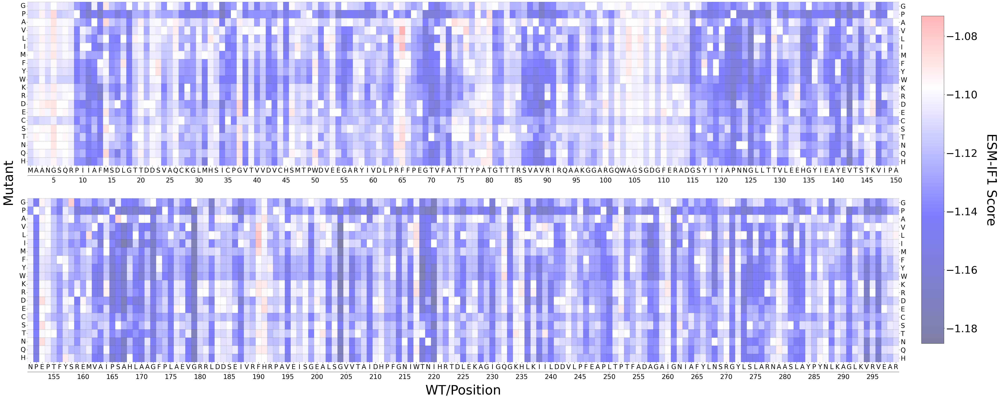

In [562]:
zsmplt.plot_heatmap(zsm_module, 'FlA_HIM_SMscan_full', 'ESM-IF1', 2, 'ESM-IF1 Score', '/Users/dahala/GitHub/ZeroShotValidation/figures')

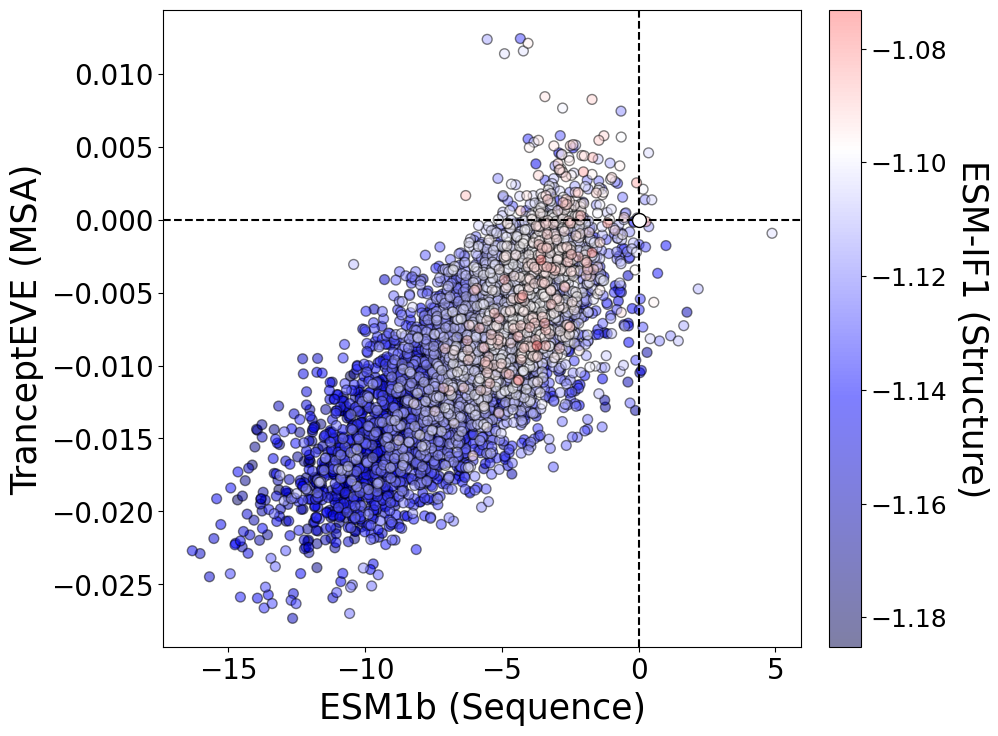

In [687]:
zsmplt.best_models_scatter(zsm_module, 'FlA_HIM_SMscan_full', best_models, labels=['ESM1b (Sequence)','TranceptEVE (MSA)','ESM-IF1 (Structure)'],
                    outpath='/Users/dahala/GitHub/ZeroShotValidation/figures')

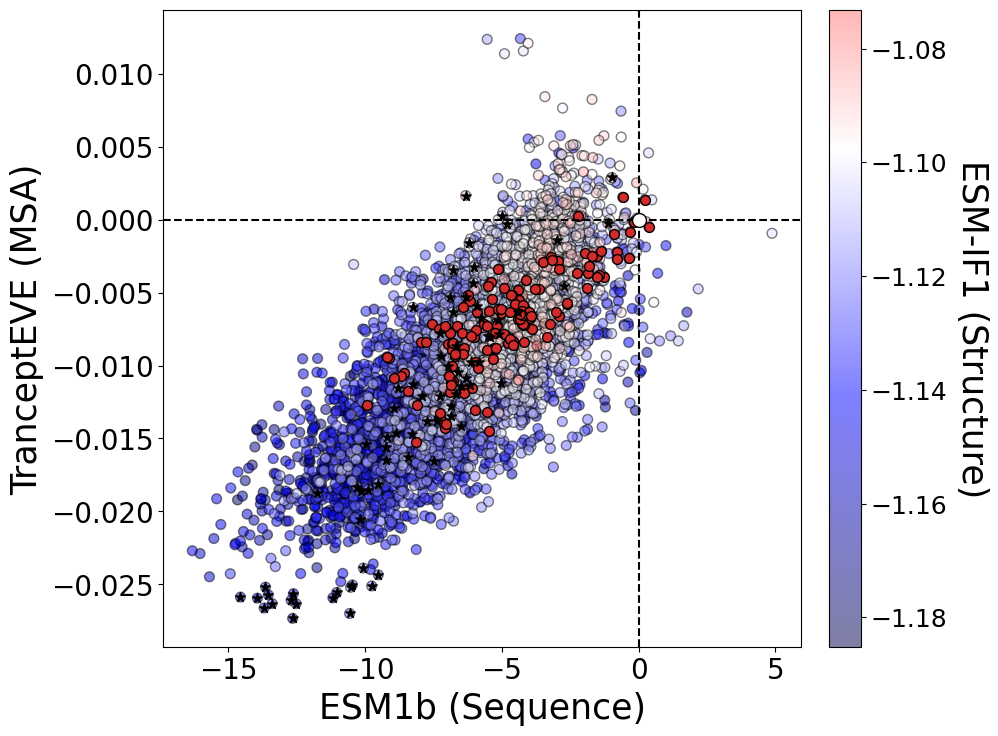

In [688]:
zsmplt.best_models_scatter(zsm_module, 'FlA_HIM_SMscan_full', best_models, labels=['ESM1b (Sequence)','TranceptEVE (MSA)','ESM-IF1 (Structure)'],
                    pos_interest=[237, 241, 277, 247, 285, 286, 287], pos_catalytic=[16, 50, 158, 215],
                    outpath='/Users/dahala/GitHub/ZeroShotValidation/figures')

# GmSuSy

In [5]:
zsm_module.set_threshold('GmSuSy_Tm',62)

In [6]:
zsm_module.load_scores('GmSuSy_Tm','/Users/dahala/GitHub/GmSuSyML/results/DMS_scores_subs/',model_list)

In [7]:
zsm_module.compute_metrics('GmSuSy_Tm',n_bootstrap=10, metrics = ['spearmanr', 'auc_roc','hit_rate'])

In [8]:
zsm_module.process_models('GmSuSy_Tm')

In [34]:
zsm_module.metric_results['GmSuSy_Tm'][('spearmanr','avg')]['ESM1b']

0.0029549461036331394

In [50]:
def zs_vs_exp_scatter(zsm, dataframe_name,model_name, custom_zsname=None, custom_expname=None,
                      sm_corr_decimal=2, sm_std_decimal=2, auc_corr_decimal=2, auc_std_decimal=2,
                      color='#394280', figsize=(9,9),size=300,
                      save_path=None):
    exp_ = zsm.datasets[dataframe_name]['exp_data'].DMS_score
    zs_score_ = zsm.datasets[dataframe_name][model_name][model_name]
    fig,ax = plt.subplots(figsize=figsize)
    ax.set_box_aspect(1)
    ax.scatter(exp_,zs_score_,color=color,edgecolor='k',s=size,alpha=0.8)

    # create a list with two empty handles (or more if needed)
    handles = [mpl_patches.Rectangle((0, 0), 1, 1, fc="white", ec="white", lw=0, alpha=0),mpl_patches.Rectangle((0, 0), 1, 1, fc="white", ec="white", lw=0, alpha=0)]

    # create the corresponding number of labels
    labels = []
    
    ax_sns = sns.regplot(x=exp_,y=zs_score_,color='darkgrey',scatter_kws={'s':0},order=2,ci=50)
    corr = zsm.metric_results[dataframe_name][('spearmanr','avg')][model_name]
    std = zsm.metric_results[dataframe_name][('spearmanr','std')][model_name]
    label = f"SM   = {corr:.{sm_corr_decimal}f}"+r'$\pm$'+f'{std:.{sm_std_decimal}f}'
    labels.append(label)
    corr = zsm.metric_results[dataframe_name][('auc_roc','avg')][model_name]
    std = zsm.metric_results[dataframe_name][('auc_roc','std')][model_name]
    label = f"AUC = {corr:.{auc_corr_decimal}f}"+r'$\pm$'+f'{std:.{auc_std_decimal}f}'
    labels.append(label)

    # create the legend, supressing the blank space of the empty line symbol and the
    # padding between symbol and label by setting handlelenght and handletextpad
    ax.legend(handles, labels, loc='best', fontsize=30, 
            fancybox=True, framealpha=0.7, 
            handlelength=0, handletextpad=0)
    ax.tick_params(axis='both', which='major', labelsize=25)

    if custom_expname is not None:
        ax.set_xlabel(custom_expname,fontsize=30)
    else:
        ax.set_xlabel('Experimental Score',fontsize=30)
    if custom_zsname is not None:
        ax.set_ylabel(custom_zsname+' Score',fontsize=30)
    else:
        ax.set_ylabel(model_name+' Score',fontsize=30)
    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path+f'{dataframe_name}_{model_name}_scatter.png',dpi=300)
    plt.show()

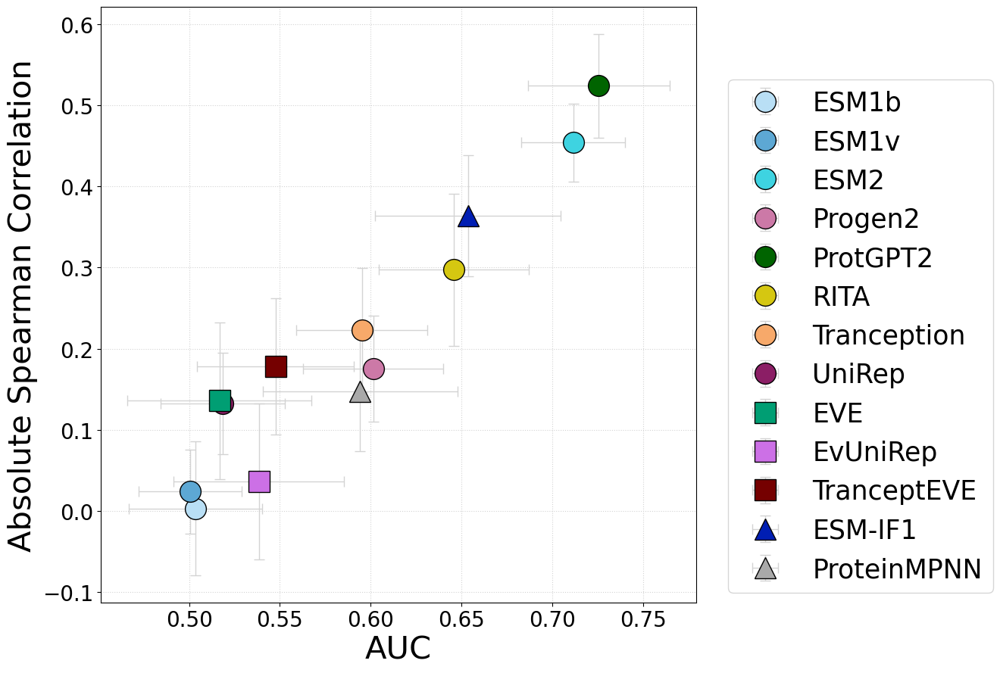

In [ ]:
zsmplt.plot_metrics(zsm_module, 'GmSuSy_Tm')

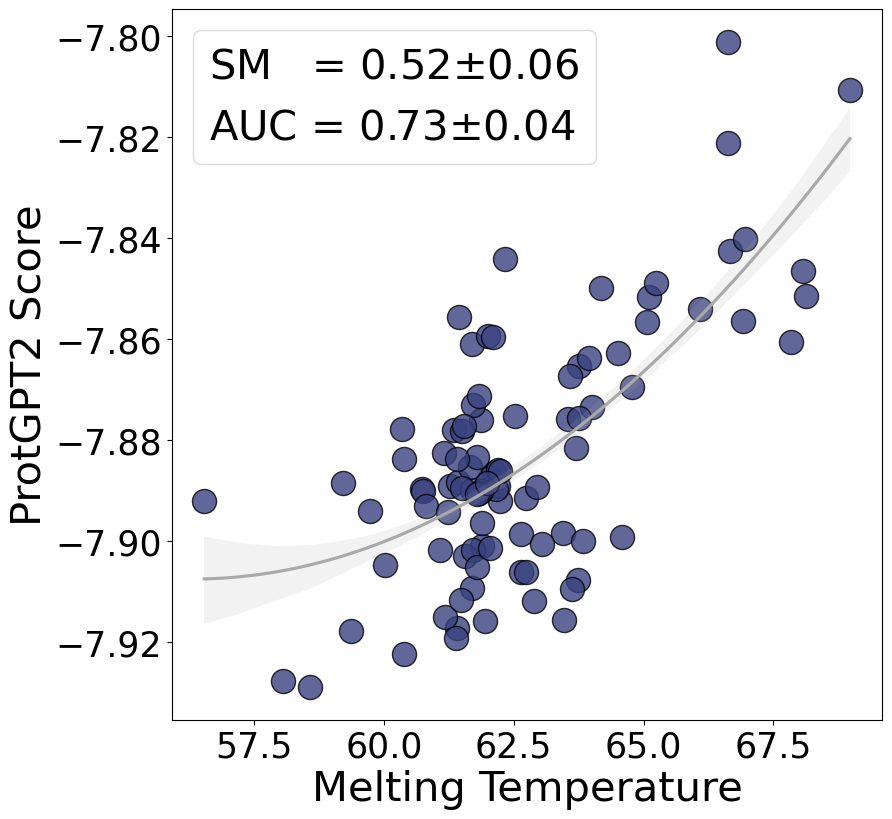

In [76]:
zsmplt.zs_vs_exp_scatter(zsm_module,'GmSuSy_Tm','ProtGPT2',custom_zsname='ProtGPT2',custom_expname='Melting Temperature',save_path='/Users/dahala/GitHub/GmSuSyML/figures/metrics/')

In [10]:
best_models = [zsm_module.best_models['GmSuSy_Tm'][cat] for cat in ['sequence','MSA','structure']]
best_model = zsm_module.best_models['GmSuSy_Tm']['overall']
print(best_models)
print(best_model)

['ProtGPT2', 'TranceptEVE_L', 'ESM-IF1']
ProtGPT2


In [11]:
Gm_SuSy_seq = "MATDRLTRVHSLRERLDETLTANRNEILALLSRIEAKGKGILQHHQVIAEFEEIPEENRQKLTDGAFGEVLRSTQEAIVLPPWVALAVRPRPGVWEYLRVNVHALVVEELQPAEYLHFKEELVDGSSNGNFVLELDFEPFNAAFPRPTLNKSIGNGVQFLNRHLSAKLFHDKESLHPLLEFLRLHSVKGKTLMLNDRIQNPDALQHVLRKAEEYLGTVPPETPYSEFEHKFQEIGLERGWGDNAERVLESIQLLLDLLEAPDPCTLETFLGRIPMVFNVVILSPHGYFAQDNVLGYPDTGGQVVYILDQVRALENEMLHRIKQQGLDIVPRILIITRLLPDAVGTTCGQRLEKVFGTEHSHILRVPFRTEKGIVRKWISRFEVWPYLETYTEDVAHELAKELQGKPDLIVGNYSDGNIVASLLAHKLGVTQCTIAHALEKTKYPESDIYWKKLEERYHFSCQFTADLFAMNHTDFIITSTFQEIAGSKDTVGQYESHTAFTLPGLYRVVHGIDVFDPKFNIVSPGADQTIYFPHTETSRRLTSFHPEIEELLYSSVENEEHICVLKDRSKPIIFTMARLDRVKNITGLVEWYGKNAKLRELVNLVVVAGDRRKESKDLEEKAEMKKMYGLIETYKLNGQFRWISSQMNRVRNGELYRVICDTRGAFVQPAVYEAFGLTVVEAMTCGLPTFATCNGGPAEIIVHGKSGFHIDPYHGDRAADLLVDFFEKCKLDPTHWDKISKAGLQRIEEKYTWQIYSQRLLTLTGVYGFWKHVSNLDRRESRRYLEMFYALKYRKLAESVPLAAE"
Gm_SuSy_SMlibrary = zsm_module.insilico_library('GmSuSy_Tm',[1],wt_seq=Gm_SuSy_seq,save_path='/Users/dahala/GitHub/ZeroShotValidation/',custom_name='SMscan')

In [12]:
zsm_module.set_threshold('GmSuSy_SMscan',62)
zsm_module.load_scores('GmSuSy_SMscan','/Users/dahala/GitHub/GmSuSyML/results/DMS_scores_subs/',[best_model],wt=True)

In [13]:
GmSuSy_ranking = zsm_module.sorting_mutants('GmSuSy_SMscan',[best_model],'ProtGPT2','/Users/dahala/GitHub/ZeroShotValidation/',wt=True)

In [14]:
zsm_module.sm_landscape('GmSuSy_SMscan',best_model,wt=True)

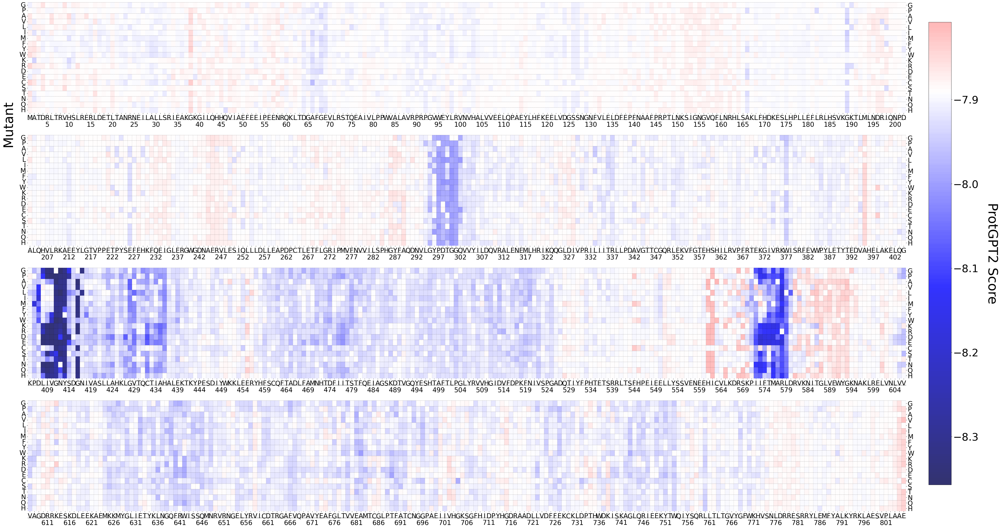

In [15]:
zsmplt.plot_heatmap(zsm_module, 'GmSuSy_SMscan', 'ProtGPT2', 4, 'ProtGPT2 Score',
                    '/Users/dahala/GitHub/ZeroShotValidation/figures',figsize=(60,35),alpha=0.8)

In [16]:
active_res = [285,296,297,298,299,300,301,302,303,304,305,380,436,442,576,578,583,646,652,673,675,576,677,678,681]
active_res.sort()
binding_res = [294,295,576,577,578,607,645,646,647,648,649,650,651,652]
binding_res.sort()
interface = [130,131,134,136,148,149,151,152,159,162,163,166,169,170,205,256,259,260,262,392,425,780,783,789]
interface.sort()
mut_pos = [514,132,390,775,650,395,523,143,528,529,18,658,660,21,534,23,152,663,410,537,796,671,35,687,47,563,180,694,315,317,319,66,453,456,73,329,206,465,86,216,218,348,222,734,481,229,104,618,490,622,111,624,754,755,629,374,758,250]
mut_pos.sort()

exclude_gmsusy = active_res + binding_res + interface

In [17]:
anc_seq = 'MAERALTRVHSLRERLDETLSAHRNEILALLSRIESHGKGILQPHQLLAEFEAIPEENRKKLTDGAFGEVLRSTQEAIVLPPWVALAVRPRPGVWEYIRVNVNALAVEELTVAEYLHFKEELVDGSSNGNFVLELDFEPFNASFPRPTLSKYIGNGVEFLNRHLSAKLFHDKDSMHPLLDFLRVHHYKGKTMMLNDRIQNLNALQSVLRKAEEYLSTLPPETPYSEFEHKFQEIGLERGWGDTAERVLEMIQLLLDLLEAPDPCTLEKFLGRIPMVFNVVILSPHGYFAQDNVLGYPDTGGQVVYILDQVRALENEMLHRIKQQGLDITPRILIVTRLLPDAVGTTCGQRLEKVYGTEHSHILRVPFRTEKGIVRKWISRFEVWPYLETYTEDVMNEIAGELQAKPDLIIGNYSDGNIVASLLAHKLGVTQCTIAHALEKTKYPDSDIYWKKFEDKYHFSCQFTADLIAMNHTDFIITSTFQEIAGSKDTVGQYESHTAFTLPGLYRVVHGIDVFDPKFNIVPPGADMSIYFPYTEEKKRLTSLHPEIEELLYSDVENEEHLCVLKDRNKPIIFSMARLDRVKNITGLVEWYGKNARLRELVNLVVVAGDRRKESKDLEEKAEMKKMYELIETYKLNGQFRWISSQMNRVRNGELYRYIADTKGAFVQPAFYEAFGLTVVEAMTCGLPTFATCHGGPAEIIVHGKSGFHIDPYHGDQAAELLVDFFEKCKADPSHWDKISQGGLKRIEEKYTWKIYSERLLTLAGVYGFWKYVSKLDRRETRRYLEMFYALKYRKLAESVPLAVEE'
protgpt2_bin = []
for i, (seq_aa, anc_aa) in enumerate(zip(Gm_SuSy_seq,anc_seq)):
    if seq_aa != anc_aa:
        mut = f'{seq_aa}{i+1}{anc_aa}'
        protgpt2_bin.append(GmSuSy_ranking[GmSuSy_ranking.mutant==mut].ProtGPT2_bin.to_list()[0])
protgpt2_bin = np.array(protgpt2_bin)

print('Ancestor Mutations Above WT:',protgpt2_bin.mean())
print('Overall Mutations Above WT:',GmSuSy_ranking.ProtGPT2_bin.mean())

Ancestor Mutations Above WT: 0.5783132530120482
Overall Mutations Above WT: 0.30192873488067995


In [18]:
protgpt2_bin = []
for pos in active_res:
    sel = np.array(GmSuSy_ranking.Pos.to_list()).flatten()==pos
    protgpt2_bin.append(GmSuSy_ranking[sel].ProtGPT2_bin.to_list()[0])
protgpt2_bin = np.array(protgpt2_bin)
print('Active Site Mutations Above WT:',protgpt2_bin.mean())

protgpt2_bin = []
for pos in binding_res:
    sel = np.array(GmSuSy_ranking.Pos.to_list()).flatten()==pos
    protgpt2_bin.append(GmSuSy_ranking[sel].ProtGPT2_bin.to_list()[0])
protgpt2_bin = np.array(protgpt2_bin)
print('Binding Site Mutations Above WT:',protgpt2_bin.mean())

protgpt2_bin = []
for pos in interface:
    sel = np.array(GmSuSy_ranking.Pos.to_list()).flatten()==pos
    protgpt2_bin.append(GmSuSy_ranking[sel].ProtGPT2_bin.to_list()[0])
protgpt2_bin = np.array(protgpt2_bin)
print('Interface Mutations Above WT:',protgpt2_bin.mean())

protgpt2_bin = []
for pos in exclude_gmsusy:
    sel = np.array(GmSuSy_ranking.Pos.to_list()).flatten()==pos
    protgpt2_bin.append(GmSuSy_ranking[sel].ProtGPT2_bin.to_list()[0])
protgpt2_bin = np.array(protgpt2_bin)

print('All Excluded Positions Mutations Above WT:',protgpt2_bin.mean())

Active Site Mutations Above WT: 0.44
Binding Site Mutations Above WT: 0.5714285714285714
Interface Mutations Above WT: 0.875
All Excluded Positions Mutations Above WT: 0.6349206349206349


In [19]:
GmSuSy_ranking_filtered = GmSuSy_ranking[~np.isin(np.array(GmSuSy_ranking.Pos.to_list()).flatten(), exclude_gmsusy)]
print('Overall Mutations Above WT, filtered:',GmSuSy_ranking_filtered.ProtGPT2_bin.mean())

Overall Mutations Above WT, filtered: 0.3062777425491439


In [72]:
np.unique(GmSuSy_ranking_filtered.head(46).Pos.to_list()).shape

(10,)

In [74]:
GmSuSy_ranking_filtered.head(46).to_csv('/Users/dahala/GitHub/GmSuSyML/GmSuSy_SMscan_ProtGTP2_top46.csv',index=False)
GmSuSy_ranking_filtered.head(46).to_excel('/Users/dahala/GitHub/GmSuSyML/GmSuSy_SMscan_ProtGTP2_top46.xlsx',index=False)